<a href="https://colab.research.google.com/github/vivian-xia/NLP_MovieReviews/blob/main/Assignment_1_First_Vectorized_Representation.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#### Vivian Xia

## MSDS453 - Research Assignment 01 - First Vectorized Representation

### Importing Packages

In [1]:
import pandas as pd
import os
import numpy as np
import random 
import re
import string
from packaging import version

from numpy import array
from numpy import argmax

import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib import pyplot

import nltk
from nltk.corpus import stopwords
from nltk.stem import PorterStemmer
from nltk.tokenize import word_tokenize 
from nltk.tokenize import RegexpTokenizer
from nltk.stem.wordnet import WordNetLemmatizer
from nltk import ngrams, FreqDist

from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.metrics.pairwise import cosine_similarity
from sklearn.cluster import KMeans
from sklearn.manifold import MDS
from sklearn.preprocessing import LabelEncoder, OneHotEncoder
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import roc_auc_score, accuracy_score, confusion_matrix, silhouette_score
from sklearn.model_selection import cross_val_score, StratifiedKFold
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import train_test_split, KFold
from sklearn.manifold import TSNE

import gensim
from gensim.models import Word2Vec,LdaMulticore, TfidfModel
from gensim import corpora
from gensim.models.doc2vec import Doc2Vec, TaggedDocument

In [2]:
import pkg_resources
pkg_resources.require("gensim<=3.8.3");

In [3]:
print("Genism Version: ", gensim.__version__)

Genism Version:  3.6.0


### NLTK Downloads

In [4]:
# Only run this once, they will be downloaded.
nltk.download('stopwords')
nltk.download('wordnet')
nltk.download('punkt')

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


True

In [5]:
import warnings
warnings.filterwarnings('ignore')

### Mount Google Drive to Colab Environment

In [6]:
from google.colab import drive
drive.mount('/content/drive/')

Drive already mounted at /content/drive/; to attempt to forcibly remount, call drive.mount("/content/drive/", force_remount=True).


### Functions

In [7]:
def get_corpus(path_to_file):
    #read in class corpus csv into python
    data=pd.read_csv(path_to_file)

    #create empty list to store text documents titles
    titles=[]
    docids=[]
    #for loop which appends the DSI title to the titles list
    for i in range(0,len(data)):
        docids.append(data['Doc_ID'].iloc[i])

    #for loop which appends the DSI title to the titles list
    for i in range(0,len(data)):
        titles.append(data['DSI_Title'].iloc[i])

    #create empty list to store text documents
    text_body=[]

    #for loop which appends the text to the text_body list
    for i in range(0,len(data)):
        temp_text=data['Text'].iloc[i]
        text_body.append(temp_text)
    return (docids,titles,text_body)

def process_corpus(data):
        
    #create empty list to store text documents titles
    titles=[]
    
    #for loop which appends the DSI title to the titles list
    for i in range(0,len(data)):
        temp_text=data['DSI_Title'].iloc[i]
        titles.append(temp_text)
    
    #create empty list to store text documents
    text_body=[]
    
    #for loop which appends the text to the text_body list
    for i in range(0,len(data)):
        temp_text=data['Text'].iloc[i]
        text_body.append(temp_text)
    
    #Note: the text_body is the unprocessed list of documents read directly form 
    #the csv.
        
    #empty list to store processed documents
    processed_text=[]
    #for loop to process the text to the processed_text list
    for i in text_body:
        text=clean_doc(i) #apply the data wrangling function
        processed_text.append(text)
    
    #Note: the processed_text is the PROCESSED list of documents read directly form 
    #the csv.  Note the list of words is separated by commas.
    
    
    #stitch back together individual words to reform body of text
    final_processed_text=[]
    
    for i in processed_text:
        temp_DSI=i[0]
        for k in range(1,len(i)):
            temp_DSI=temp_DSI+' '+i[k]
        final_processed_text.append(temp_DSI)
    
    return titles, final_processed_text, processed_text

In [8]:
def remove_stop_words(in_text):
    stop_words = set(stopwords.words('english'))  #create list of stop words NLTK
    word_tokens = word_tokenize(in_text)  
    filtered_sentence = [w for w in word_tokens if not w in stop_words] 
    filtered_sentence = [] 
    for w in word_tokens: 
        if w not in stop_words: 
            filtered_sentence.append(w) 

    return filtered_sentence


def apply_stemming(in_text):
    stemmer = PorterStemmer()
    word_list = nltk.word_tokenize(in_text)
    output = ' '.join([stemmer.stem(w) for w in word_list])
    return output


def apply_lemmatization(in_text):
    # Lemmatization
    lem = WordNetLemmatizer()
    word_list = nltk.word_tokenize(in_text)
    output = ' '.join([lem.lemmatize(w) for w in word_list])
    return output

##Top term

In [9]:
#top 10 td-idf score terms
def top_term_scores():
  term=[]
  score=[]

  #import my 10 documents
  for doc in range(1,11): 
    path_to_docs='VXL_Doc{}_GuardiansOfTheGalaxy'.format(doc)
    data=pd.read_csv(path_to_docs)
    
    for i in data['term']:
        term.append(i)
    for i in data['score']:
        score.append(i)

  d = {'Term':term,'Score':score}
  term_score_df = pd.DataFrame(d) #dataframe with all the terms and scores from the 10 documents (so there are repeats)
  term_score_df = term_score_df[term_score_df['Score'] > 0] #tf-idf scores greater than 0

  for i in term_score_df['Term']:
    scores = []
    for index, term in enumerate(term_score_df['Term']):
      
      if(i==term):
        scores.append(term_score_df['Score'].iloc[index])
    
    #print(i)
    #print(scores)  
    mean_score = sum(scores)/len(scores) #calculate mean score of duplicated terms in the dataframe

    term_score_df = term_score_df[term_score_df['Term'] != i] #filter dataframe of the duplicated term
    df2 = {'Term': i, 'Score': mean_score}
    term_score_df = term_score_df.append(df2, ignore_index = True) #append the term and mean td-idf score
  
  term_score_df['Score'] = (term_score_df['Score']/10).round(2) #average score among the ten documents 
  term_score_df = term_score_df.sort_values(by=['Score'], ascending=False)
  
  return term_score_df

In [10]:
#functions to create and plot word2vec matrix
def run_word2vec(processed_text, dimension_size):

    #word to vec model
    model_w2v = Word2Vec(processed_text, size=dimension_size, window=3, min_count=2, workers=4)  #size=100,200,300 dimensions (each column is a feature) and every row is a word -- all dense vectors not 0 and 1
    
    labels = []
    tokens = []

    for word in model_w2v.wv.vocab:
        tokens.append(model_w2v[word])
        labels.append(word)
    
    
    return labels, tokens, model_w2v



def plot_word2vec(model, labels, tokens, _perplexity=30):
    "Creates and TSNE model and plots it"
    words = []
    embeddings = []
    for word in list(model.wv.vocab):
        embeddings.append(model.wv[word])
        words.append(word)

    tsne_model= TSNE(perplexity=_perplexity, n_components=2, init='pca', n_iter=3500, random_state=32)
    new_values = tsne_model.fit_transform(tokens)
    x = []
    y = []
    for value in new_values:
        x.append(value[0])
        y.append(value[1])
        
    plt.figure(figsize=(40, 40)) 
    for i in range(len(x)):
        plt.scatter(x[i],y[i])
        plt.annotate(labels[i],
                     xy=(x[i], y[i]),
                     xytext=(5, 2),
                     textcoords='offset points',
                     ha='right',
                     va='bottom')
    plt.show()


In [11]:
#functions to create and plot doc2vec matrix
def run_doc2vec(final_processed_text, processed_text, dimension_size):
    #create doc2vec matrix
    documents = [TaggedDocument(doc, [i]) for i, doc in enumerate(final_processed_text)]
    model = Doc2Vec(documents, vector_size=dimension_size, window=3, min_count=2, workers=4)    #doc2vec dimension size 100,200,300
    
    doc2vec_df=pd.DataFrame()
    for i in range(0,len(processed_text)):
        vector=pd.DataFrame(model.infer_vector(processed_text[i])).transpose()
        doc2vec_df=pd.concat([doc2vec_df,vector], axis=0)
        
    return doc2vec_df




def plot_doc2vec(doc2vec_df, titles,_perplexity=10):
    #visualize documents through applying TSNE to doc2vec matrix
    tsne_model = TSNE(perplexity=_perplexity, n_components=2, init='pca', n_iter=2500, random_state=23)
    doc2vec_df = tsne_model.fit_transform(doc2vec_df)
    x = []
    y = []
    for value in doc2vec_df:
        x.append(value[0])
        y.append(value[1])

    plt.figure(figsize=(16, 16)) 
    for i in range(len(x)):
        plt.scatter(x[i],y[i])
        plt.annotate(titles[i],
                     xy=(x[i], y[i]),
                     xytext=(5, 2),
                     textcoords='offset points',
                     ha='right',
                     va='bottom')
    plt.show()
    

# Method 1 Experiments



## Data wrangling
baseline = tokenization + normalization (remove punctuation, remove short tokens with 3 characters or less, normalize to lowercase)

### Source Class Corpus


In [12]:
os.chdir('/content/drive/My Drive/Colab Notebooks/MSDS453/Assignment 1/')

path_to_file='ClassCorpus.csv'
docids,titles,text=get_corpus(path_to_file)
print(titles) #names of the 250 documents

['HAG_Doc1_Frozen2', 'HAG_Doc2_Frozen2', 'HAG_Doc3_Frozen2', 'HAG_Doc4_Frozen2', 'HAG_Doc5_Frozen2', 'HAG_Doc6_Frozen2', 'HAG_Doc7_Frozen2', 'HAG_Doc8_Frozen2', 'HAG_Doc9_Frozen2', 'HAG_Doc10_Frozen2', 'RIA_Doc1_SpiderMan3', 'RIA_Doc2_SpiderMan3', 'RIA_Doc3_SpiderMan3', 'RIA_Doc4_SpiderMan3', 'RIA_Doc5_SpiderMan3', 'RIA_Doc6_SpiderMan3', 'RIA_Doc7_SpiderMan3', 'RIA_Doc8_SpiderMan3', 'RIA_Doc9_SpiderMan3', 'RIA_Doc10_SpiderMan3', 'CAA_Doc1_Cruella', 'CAA_Doc2_Cruella', 'CAA_Doc3_Cruella', 'CAA_Doc4_Cruella', 'CAA_Doc5_Cruella', 'CAA_Doc6_Cruella', 'CAA_Doc7_Cruella', 'CAA_Doc8_Cruella', 'CAA_Doc9_Cruella', 'CAA_Doc10_Cruella', 'AAT_Doc1_TheMatrixResurrecton', 'AAT_Doc2_TheMatrixResurrecton', 'AAT_Doc3_TheMatrixResurrecton', 'AAT_Doc4_TheMatrixResurrecton', 'AAT_Doc5_TheMatrixResurrecton', 'AAT_Doc6_TheMatrixResurrecton', 'AAT_Doc7_TheMatrixResurrecton', 'AAT_Doc8_TheMatrixResurrecton', 'AAT_Doc9_TheMatrixResurrecton', 'AAT_Doc10_TheMatrixResurrecton', 'BARRYC_Doc1_GroundhogDay', 'BARRYC

### Functions for pre-processing

In [13]:
#only the methods used in Method 1 were not commented out
def clean_doc(doc): 
    #split document into individual words
    #doc = ' '.join(remove_stop_words(doc))
    #doc = apply_lemmatization(doc)

    tokens = doc.split()
    re_punc = re.compile('[%s]' % re.escape(string.punctuation))
    # remove punctuation from each word
    tokens = [re_punc.sub('', w) for w in tokens]
    # remove remaining tokens that are not alphabetic
    #tokens = [word for word in tokens if word.isalpha()]
    # filter out short tokens
    tokens = [word for word in tokens if len(word) > 3]
    #lowercase all words
    tokens = [word.lower() for word in tokens]
    
    return tokens

### Pre-process data set

In [14]:
os.chdir('/content/drive/My Drive/Colab Notebooks/MSDS453/Assignment 1/')
path_to_file='ClassCorpus.csv'
data = pd.read_csv(path_to_file)

In [15]:
#process documents
titles, final_processed_text, processed_text = process_corpus(data)


#number of tokens
len_tokens = []
for i in final_processed_text:
  len_tokens.append(len(i))

print(sum(len_tokens))

#tokens from five random texts in the corpus
for i in np.random.randint(0,249,5):
  print(final_processed_text[i])

893561
this those reviews where know minority know everyone will disagree going give honest review chips fall where they didn’t love pacific went fully expecting to—wanting to—but didn’t couldn’t love this isn’t hated didn’t hate it’s dumbest movie i’ve seen this summer white house down worst lone ranger just wasn’t nearly good expected most predictable screenplays i’ve seen long time maybe ever holding being dumb movie against pacific never thought would anything dumb thought would director guillermo toro’s take dumb movie which silly maybe even stupid engrossing strange entertaining like toro movie it’s stupid into worse it’s lazy toro clearly great love classic kaiju movies like godzilla mothra lovingly rendered every monster robot with incredible detail—this some most spectacular you’ll anywhere wish he’d invested even fraction that care just character just needed thing care about pacific there nothing we’re supposed care about raleigh becket charlie hunnam sons anarchy character c

##Document Vectorization using tf-idf

### Calculates TFIDF and Saves TFIDF Values for Terms

In [16]:
vectorizer = TfidfVectorizer(stop_words='english', use_idf=True, norm=None)
transformed_documents = vectorizer.fit_transform(final_processed_text)
transformed_documents_as_array = transformed_documents.toarray()

output_dir ="TFIDF_output.csv"

if not os.path.exists(output_dir):
    os.makedirs(output_dir)

for counter, doc in enumerate(transformed_documents_as_array):
    # construct a dataframe
    tf_idf_tuples = list(zip(vectorizer.get_feature_names(), doc))
    one_doc_as_df = pd.DataFrame.from_records(tf_idf_tuples
                                              ,columns=['term', 'score']).sort_values(by='score', ascending=False).reset_index(drop=True)
    
    # output to a csv using the enumerated value for the filename
    one_doc_as_df.to_csv(output_dir+"/"+str(titles[counter]))

In [17]:
os.chdir('/content/drive/My Drive/Colab Notebooks/MSDS453/Assignment 1/TFIDF_output.csv/')

top_term_scores().head(10)

,Term,Score
1573,guardians,2.06
98,ideological,2.05
1572,galaxy,1.50
99,formulaic,1.47
1363,marvel,1.46
1701,quill,1.36
579,prologue,1.27
313,flying,1.27
100,values,1.24
1575,ikea,1.17


##Terms by Embedding Matrix

### 100 Embedding Dimensions

In [18]:
titles, final_processed_text, processed_text = process_corpus(data)
labels, tokens, word2vec_model = run_word2vec(processed_text, 100)

#### Plot word2vec TSNE

In [19]:
#create random subset of 100 tokens
weights = []

random_labels = random.sample(labels, 100)

for i in random_labels:
  weights.append(word2vec_model[i])

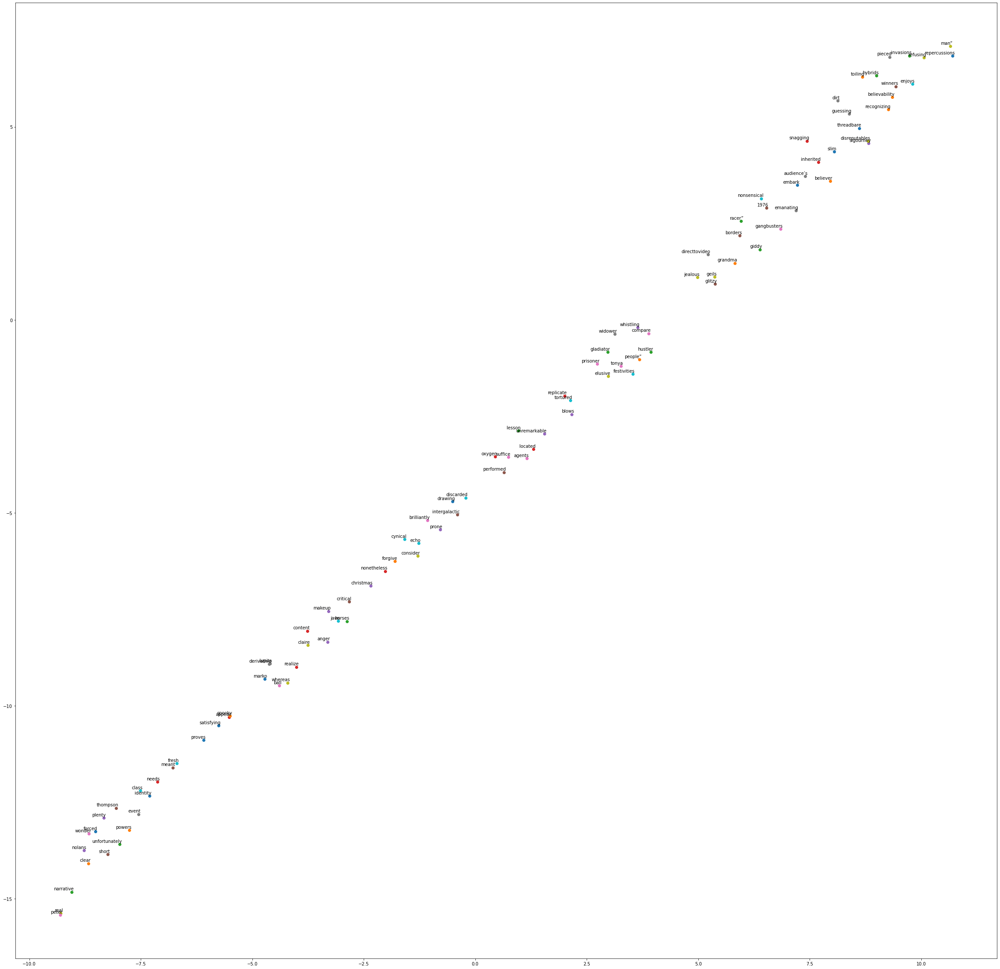

In [20]:
%%time
plot_word2vec(word2vec_model, random_labels, weights, 20)

#### Plot word2vec heatmap for cosine similarity

In [21]:
df = pd.DataFrame(weights, index=random_labels)
df.head()

CPU times: user 2.48 s, sys: 183 ms, total: 2.66 s
Wall time: 2.22 s


,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,...,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99
proves,0.009176,0.014985,0.015094,-0.078191,0.087483,-0.120176,0.021267,0.070159,0.051425,0.042464,-0.017129,0.086187,0.023253,0.008285,0.027255,-0.034399,-0.018815,0.068814,-0.014768,0.025822,0.001510,0.015186,0.040544,-0.008546,-0.042509,-0.012453,0.017988,-0.067630,-0.196344,0.067575,0.149205,0.176823,0.061331,0.044350,0.034709,-0.088226,0.045369,0.102409,0.070730,-0.009052,...,0.044012,-0.105067,0.115385,-0.103074,0.099684,-0.095693,0.025024,-0.064239,0.042688,-0.129510,0.037759,-0.023864,-0.079451,-0.025753,0.079317,-0.088504,0.057011,0.031000,-0.107820,-0.053099,-0.108523,-0.171130,0.253623,-0.044931,0.010037,0.238212,0.094210,-0.056251,0.089498,-0.068191,0.162615,-0.032460,0.084669,-0.074506,0.013205,0.051464,0.126058,-0.028987,-0.046747,-0.011321
believer,0.005815,0.001855,-0.003049,-0.009369,0.009049,-0.016171,0.004552,0.004932,0.011155,0.010023,-0.004659,0.008643,0.006590,-0.001688,0.007248,-0.001040,-0.005409,0.005128,-0.000828,0.005484,0.000443,0.006187,0.010231,-0.004584,-0.010937,-0.006902,0.000765,-0.005426,-0.031679,0.011501,0.017196,0.021513,0.012324,0.002018,0.005750,-0.014788,0.002356,0.014597,0.008438,-0.001268,...,0.003197,-0.016185,0.021013,-0.010404,0.011901,-0.015159,0.005613,-0.012474,0.006249,-0.019933,0.005845,-0.004423,-0.013210,-0.004708,0.009842,-0.011053,0.008031,0.004353,-0.012752,-0.008094,-0.013340,-0.027604,0.039173,-0.003801,0.004656,0.038835,0.010440,-0.007462,0.012199,-0.011746,0.023160,-0.008592,0.014696,-0.012876,-0.000982,0.006919,0.023461,-0.002548,-0.005990,-0.004280
narrative,0.022372,0.056612,0.045514,-0.221001,0.250022,-0.365693,0.069922,0.203290,0.151261,0.115589,-0.048681,0.246465,0.074092,0.017452,0.074511,-0.111372,-0.042119,0.192206,-0.033164,0.086980,0.000688,0.040526,0.123771,-0.021141,-0.116073,-0.050019,0.044467,-0.202915,-0.588675,0.213852,0.443783,0.508766,0.189108,0.129503,0.106945,-0.242937,0.133993,0.303355,0.220443,-0.037975,...,0.139193,-0.303936,0.351817,-0.303709,0.285062,-0.273747,0.067207,-0.195387,0.114918,-0.397441,0.113549,-0.067707,-0.237657,-0.070937,0.227262,-0.254128,0.166147,0.084488,-0.322252,-0.163568,-0.334143,-0.506321,0.753074,-0.122315,0.021036,0.690658,0.272860,-0.162377,0.272396,-0.200443,0.462420,-0.093729,0.246986,-0.225084,0.045489,0.152324,0.374748,-0.073010,-0.142135,-0.038799
oxygen,0.003783,0.003031,0.007992,-0.023560,0.022394,-0.042847,0.003538,0.017724,0.018191,0.012194,-0.006599,0.023954,0.009428,-0.002176,0.003334,-0.007878,-0.006695,0.023229,0.000910,0.007677,0.001681,0.003265,0.008734,-0.001506,-0.017444,-0.001770,0.006812,-0.020933,-0.061587,0.018630,0.041061,0.049678,0.017027,0.010846,0.006167,-0.027060,0.014864,0.035301,0.023054,-0.001909,...,0.011319,-0.036361,0.035791,-0.035317,0.034547,-0.027901,0.008608,-0.017979,0.011519,-0.044008,0.016740,-0.011837,-0.028273,-0.006020,0.024037,-0.022991,0.012221,0.008043,-0.037581,-0.021167,-0.035737,-0.056232,0.082134,-0.009889,0.007248,0.074318,0.031771,-0.020754,0.025877,-0.023546,0.048911,-0.006096,0.022206,-0.028541,0.008328,0.014445,0.034850,-0.011638,-0.011965,-0.000406
blows,0.000004,0.006055,-0.000838,-0.021961,0.025474,-0.034393,0.003928,0.021638,0.013746,0.005376,-0.009298,0.022530,0.008644,0.004745,0.006469,-0.011118,-0.002755,0.020361,-0.005329,0.004975,-0.002349,0.007900,0.007281,0.002489,-0.010956,-0.007129,0.007033,-0.017757,-0.056760,0.024061,0.035292,0.043119,0.013881,0.009083,0.005553,-0.022154,0.016525,0.031700,0.016108,-0.008126,...,0.015432,-0.026104,0.031456,-0.025499,0.025326,-0.025139,0.002597,-0.014829,0.012250,-0.036187,0.013515,-0.007346,-0.023600,-0.002635,0.017231,-0.027097,0.011324,0.010184,-0.027115,-0.015368,-0.026595,-0.048259,0.066933,-0.012589,0.002937,0.065959,0.027377,-0.013509,0.022449,-0.014048,0.045302,-0.010432,0.021696

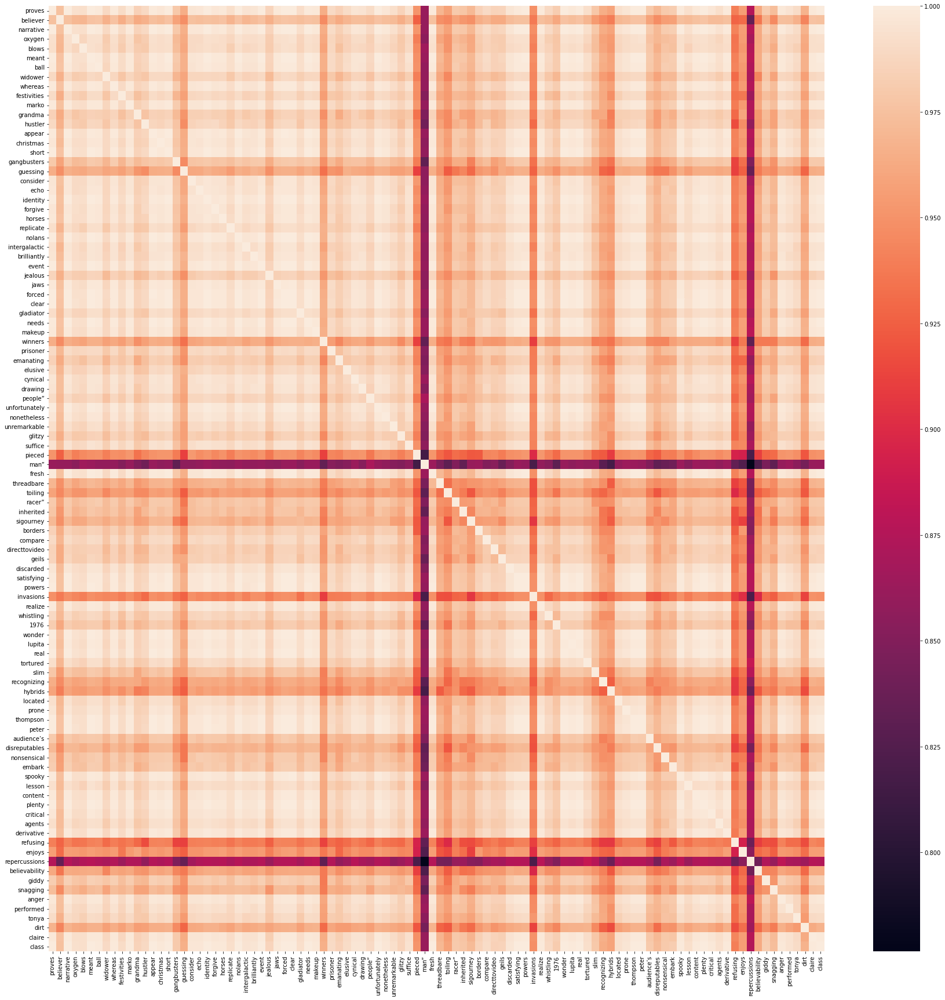

In [22]:
similarity  = cosine_similarity(df, df)
a4_dims = (30, 30)
fig, ax = pyplot.subplots(figsize=a4_dims)
sns.heatmap(ax=ax, data=similarity, xticklabels=random_labels, yticklabels=random_labels);

### 200 Embedding Dimensions

In [23]:
titles, final_processed_text, processed_text = process_corpus(data)
labels, tokens, word2vec_model = run_word2vec(processed_text, 200)

#### Plot word2vec TSNE

In [24]:
#create random subset of 100 tokens
weights = []

random_labels = random.sample(labels, 100)

for i in random_labels:
  weights.append(word2vec_model[i])

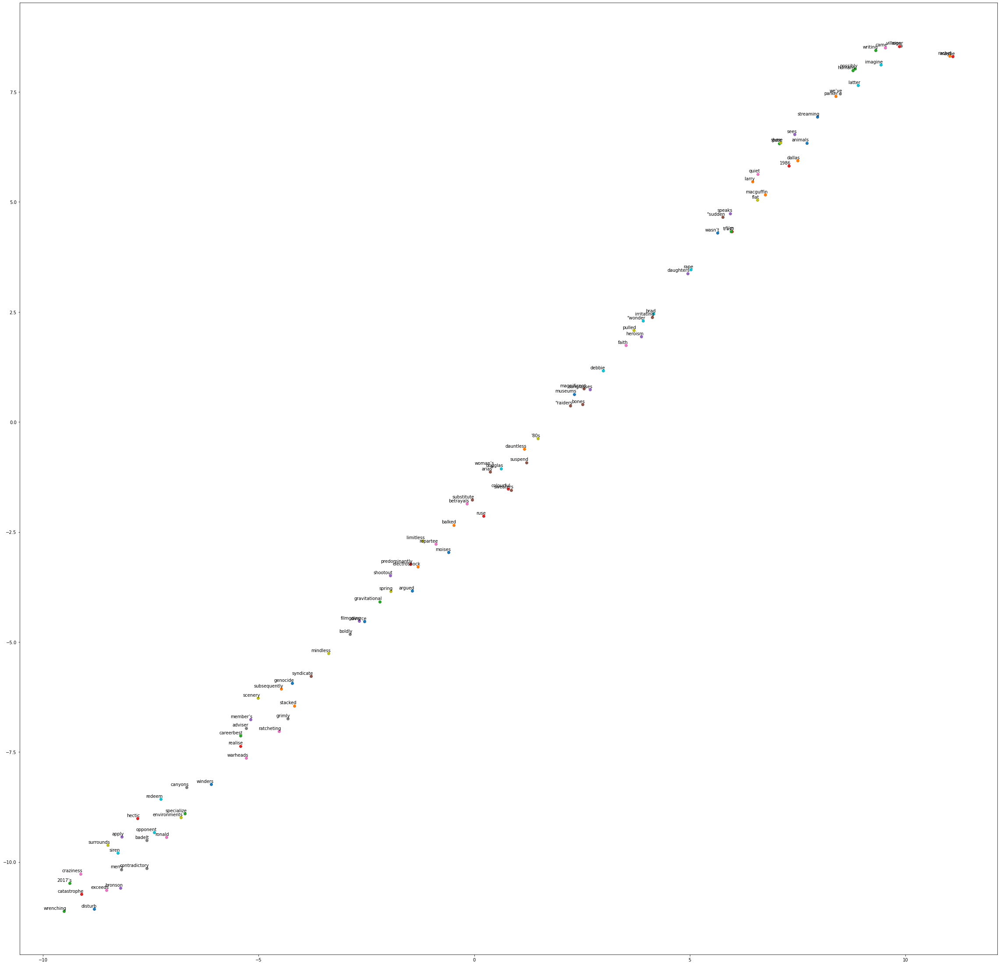

CPU times: user 2.7 s, sys: 172 ms, total: 2.87 s
Wall time: 2.26 s


In [25]:
%%time
plot_word2vec(word2vec_model, random_labels, weights, 20)

#### Plot word2vec heatmap for cosine similarity

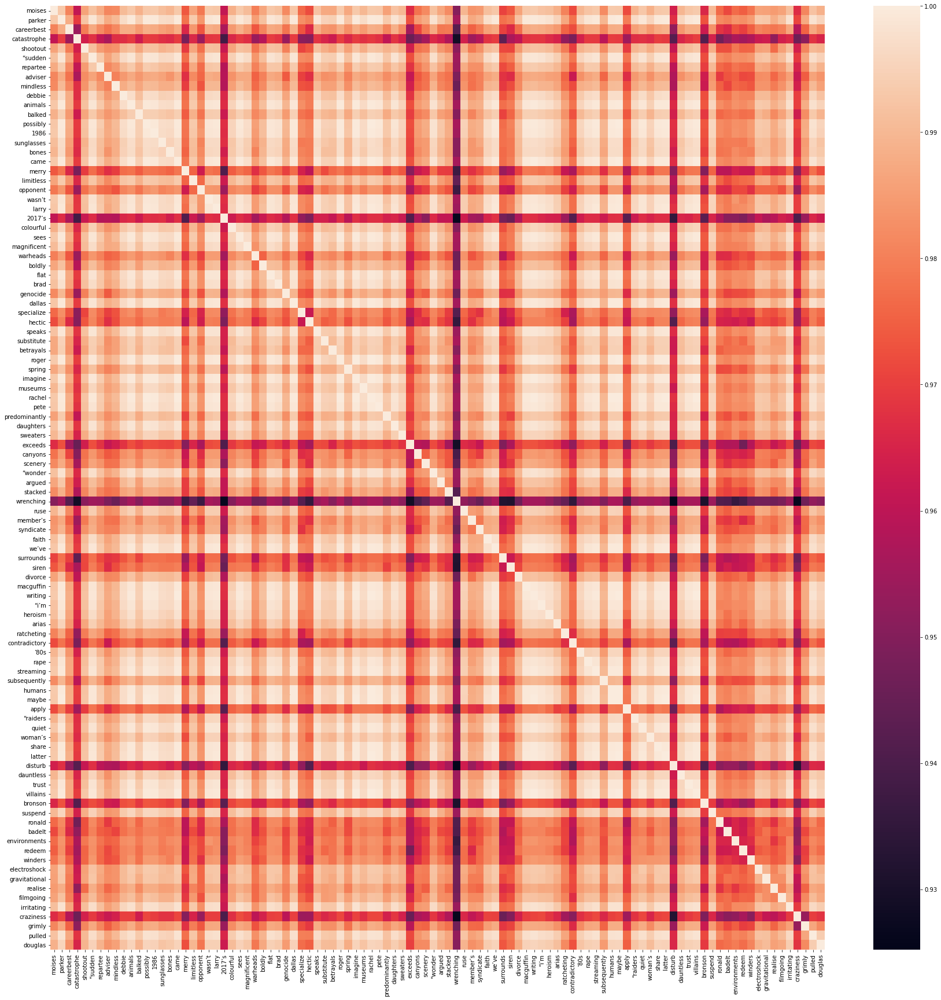

In [26]:
df = pd.DataFrame(weights, index=random_labels)

similarity  = cosine_similarity(df, df)
a4_dims = (30, 30)
fig, ax = pyplot.subplots(figsize=a4_dims)
sns.heatmap(ax=ax, data=similarity, xticklabels=random_labels, yticklabels=random_labels);

### 300 Embedding Dimensions

In [27]:
titles, final_processed_text, processed_text = process_corpus(data)
labels, tokens, word2vec_model = run_word2vec(processed_text, 300)

#### Plot word2vec TSNE

In [28]:
#create random subset of 100 tokens
weights = []

random_labels = random.sample(labels, 100)

for i in random_labels:
  weights.append(word2vec_model[i])

Tokens are the embedding vectors -- the important weights/features

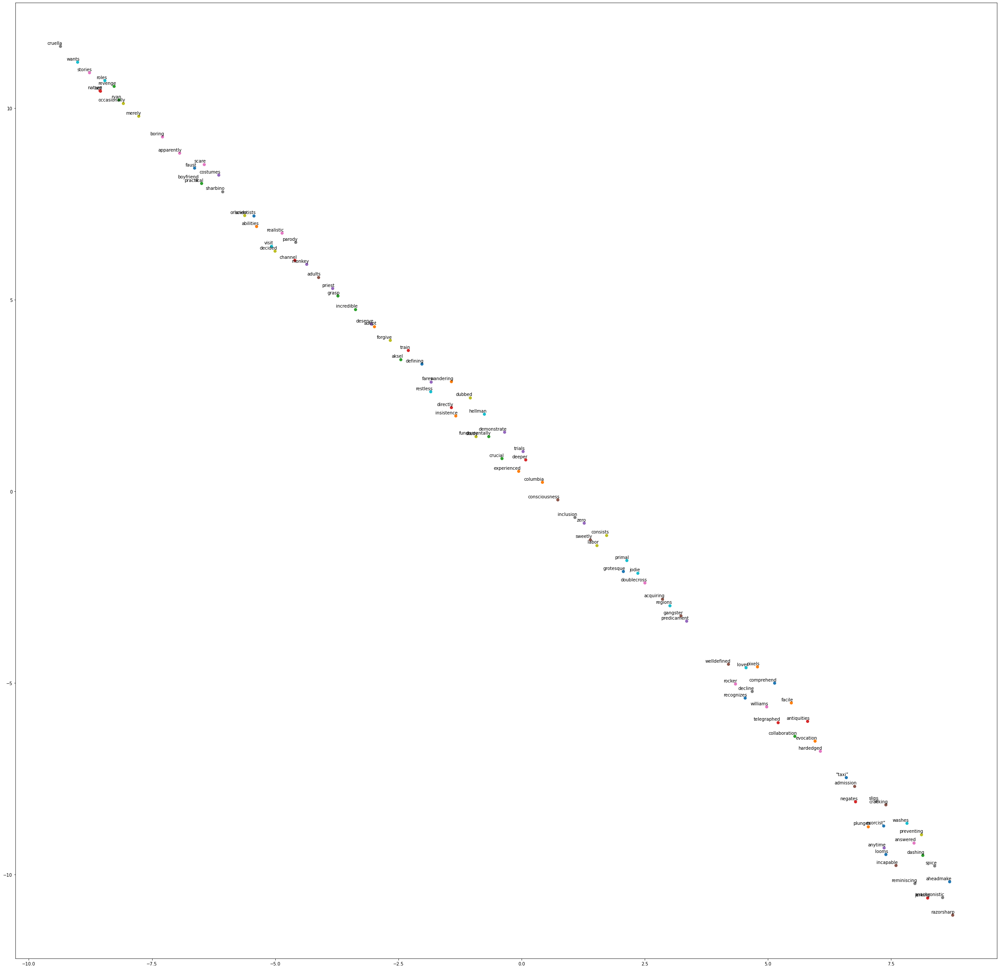

CPU times: user 2.6 s, sys: 129 ms, total: 2.73 s
Wall time: 2.19 s


In [29]:
%%time
plot_word2vec(word2vec_model, random_labels, weights, 20)

#### Plot word2vec heatmap for cosine similarity

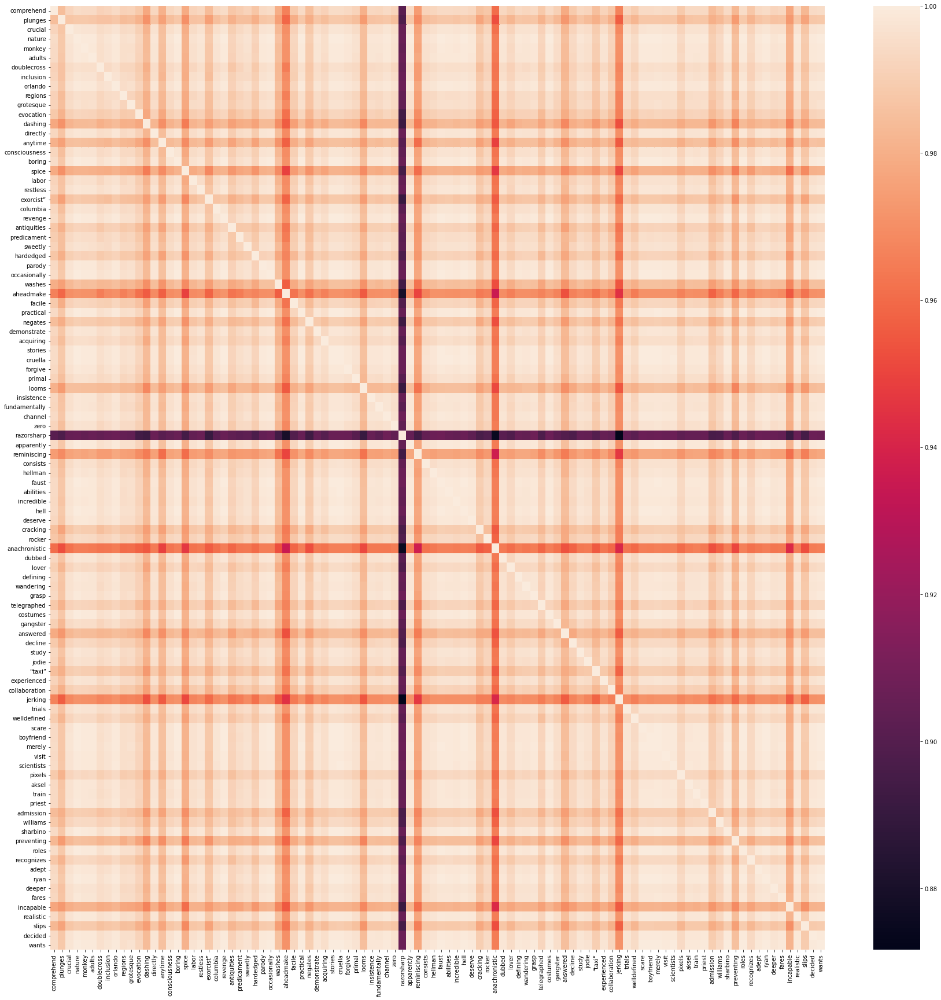

In [30]:
df = pd.DataFrame(weights, index=random_labels)

similarity  = cosine_similarity(df, df)
a4_dims = (30, 30)
fig, ax = pyplot.subplots(figsize=a4_dims)
sns.heatmap(ax=ax, data=similarity, xticklabels=random_labels, yticklabels=random_labels);

## Documents by Embedding Matrix

### 100 Embedding Dimensions

In [31]:
doc2vec_df = run_doc2vec(final_processed_text, processed_text, 100)

#### Plot doc2vec TSNE 

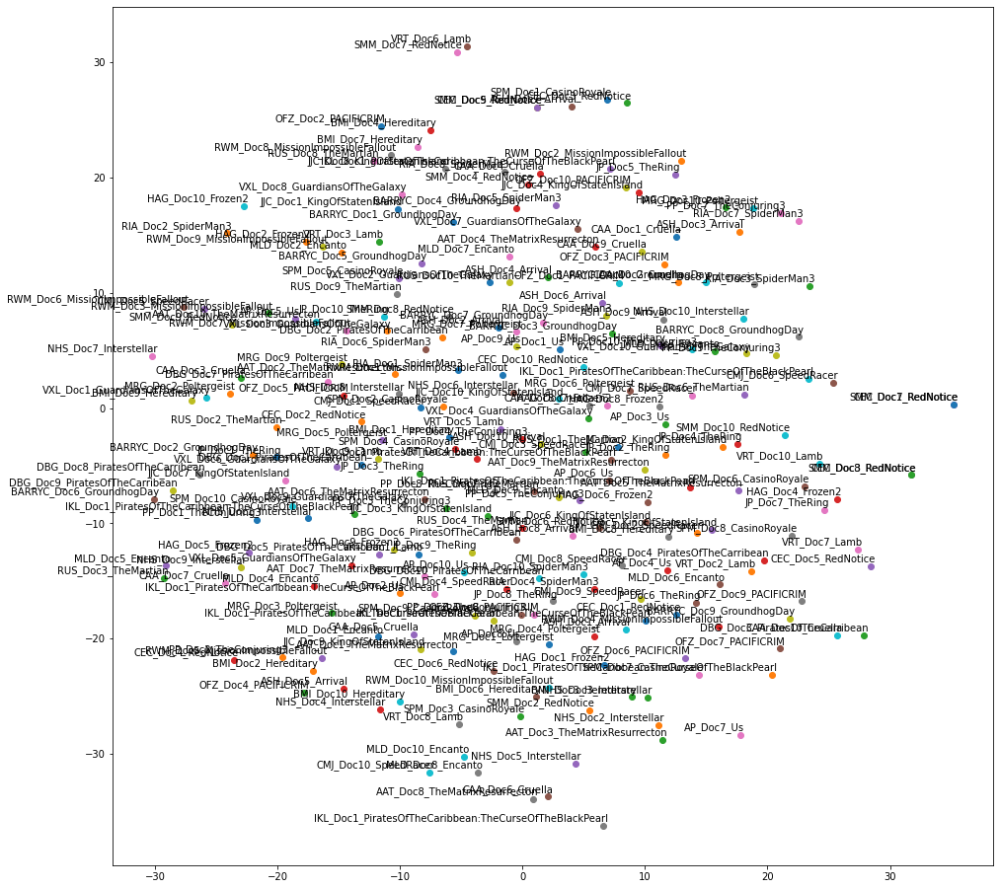

In [32]:
plot_doc2vec(doc2vec_df, titles,15)

#### Plot Heatmap of Cosine Similarity of Documents using TFIDF matrix

In [33]:
doc_term_matrix = transformed_documents.todense()
df = pd.DataFrame(doc_term_matrix, 
                      columns=vectorizer.get_feature_names(), 
                      index=docids)

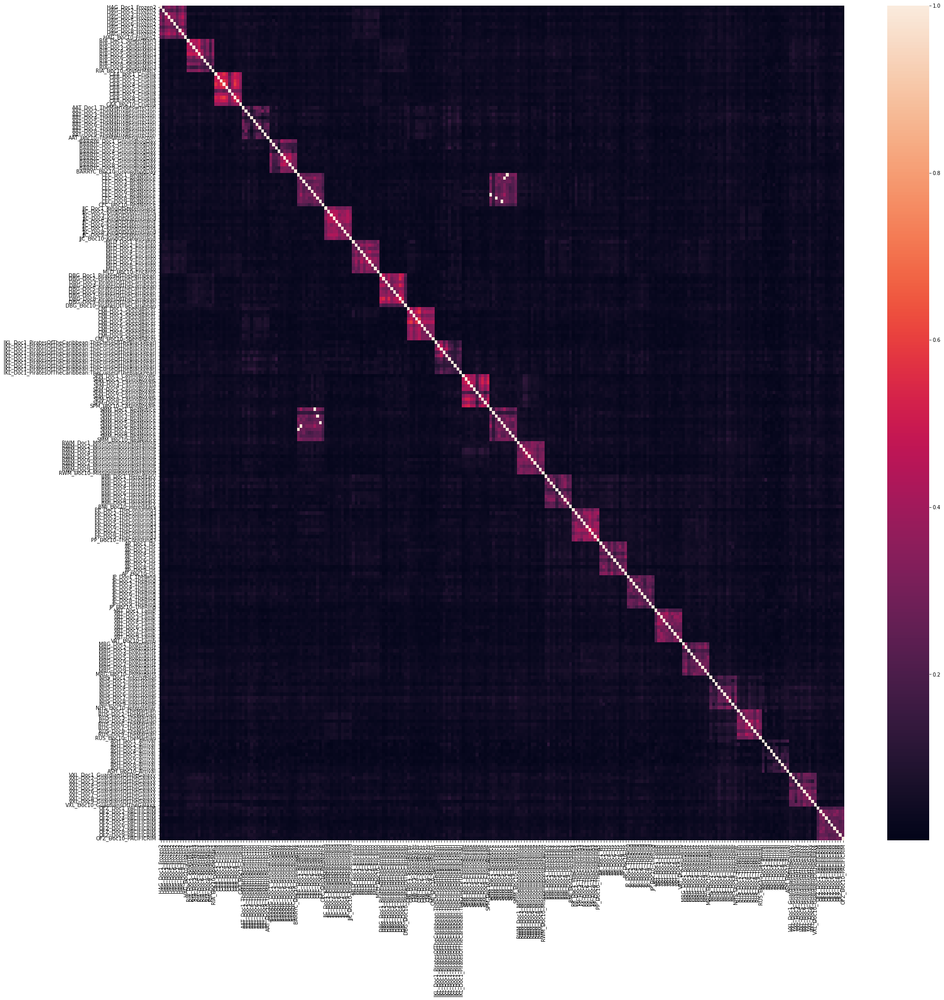

In [34]:
similarity  = cosine_similarity(df, df)
a4_dims = (30, 30)
fig, ax = pyplot.subplots(figsize=a4_dims)
sns.heatmap(ax=ax, data=similarity, xticklabels= titles, yticklabels=titles);

### 200 Embedding Dimensions

In [35]:
doc2vec_df = run_doc2vec(final_processed_text, processed_text, 200)

#### Plot doc2vec TSNE 

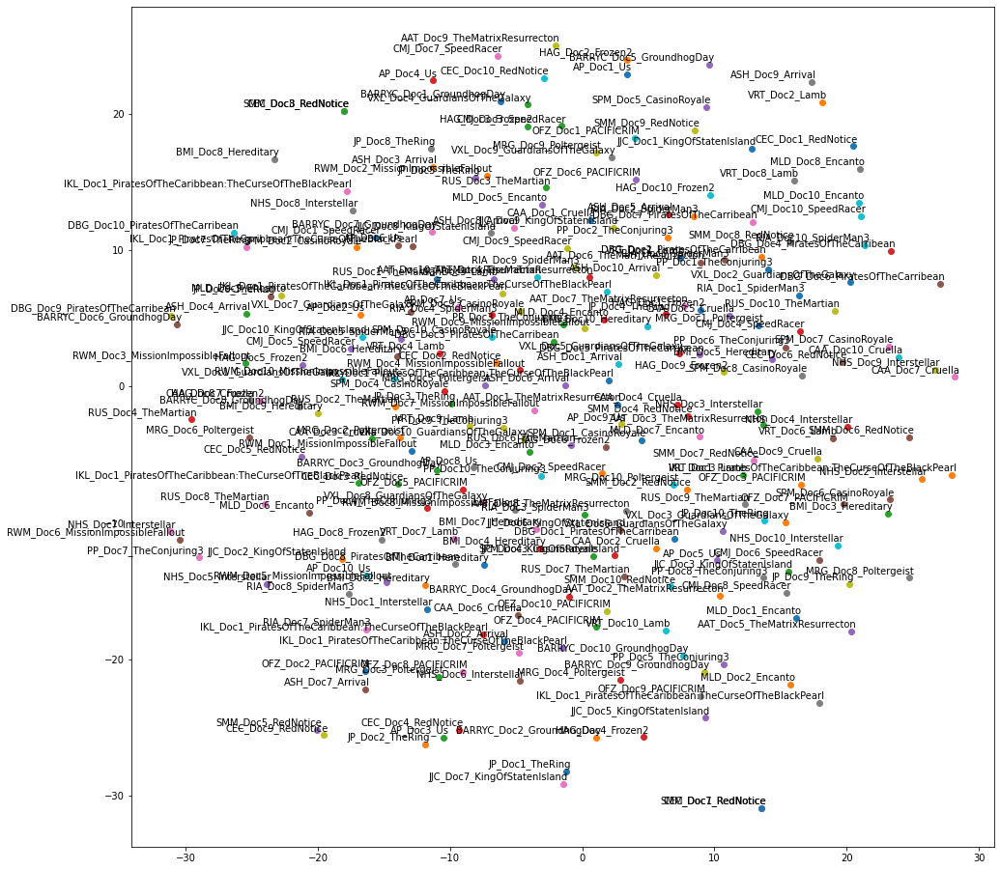

In [36]:
plot_doc2vec(doc2vec_df, titles,15)

#### Plot Heatmap of Cosine Similarity of Documents using TFIDF matrix

In [37]:
doc_term_matrix = transformed_documents.todense()
df = pd.DataFrame(doc_term_matrix, 
                      columns=vectorizer.get_feature_names(), 
                      index=docids)

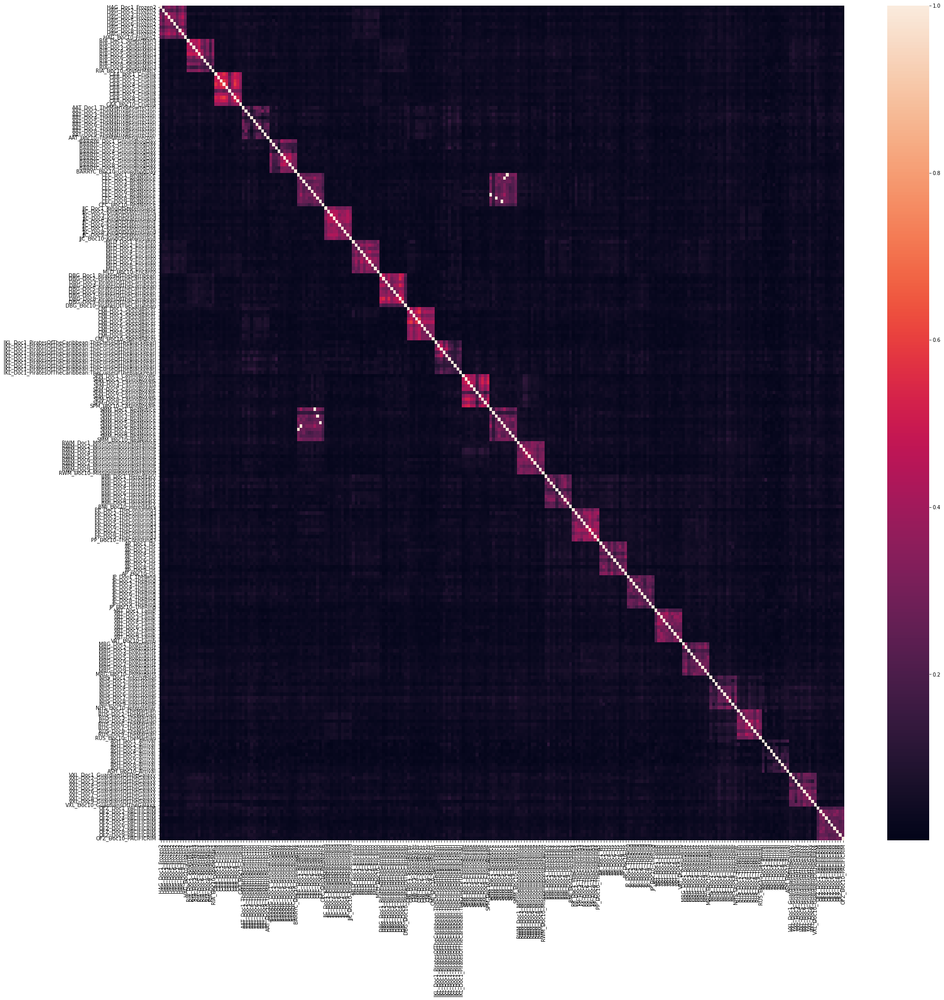

In [38]:
similarity  = cosine_similarity(df, df)
a4_dims = (30, 30)
fig, ax = pyplot.subplots(figsize=a4_dims)
sns.heatmap(ax=ax, data=similarity, xticklabels= titles, yticklabels=titles);

### 300 Embedding Dimensions

In [39]:
doc2vec_df = run_doc2vec(final_processed_text, processed_text, 300)

#### Plot doc2vec TSNE 

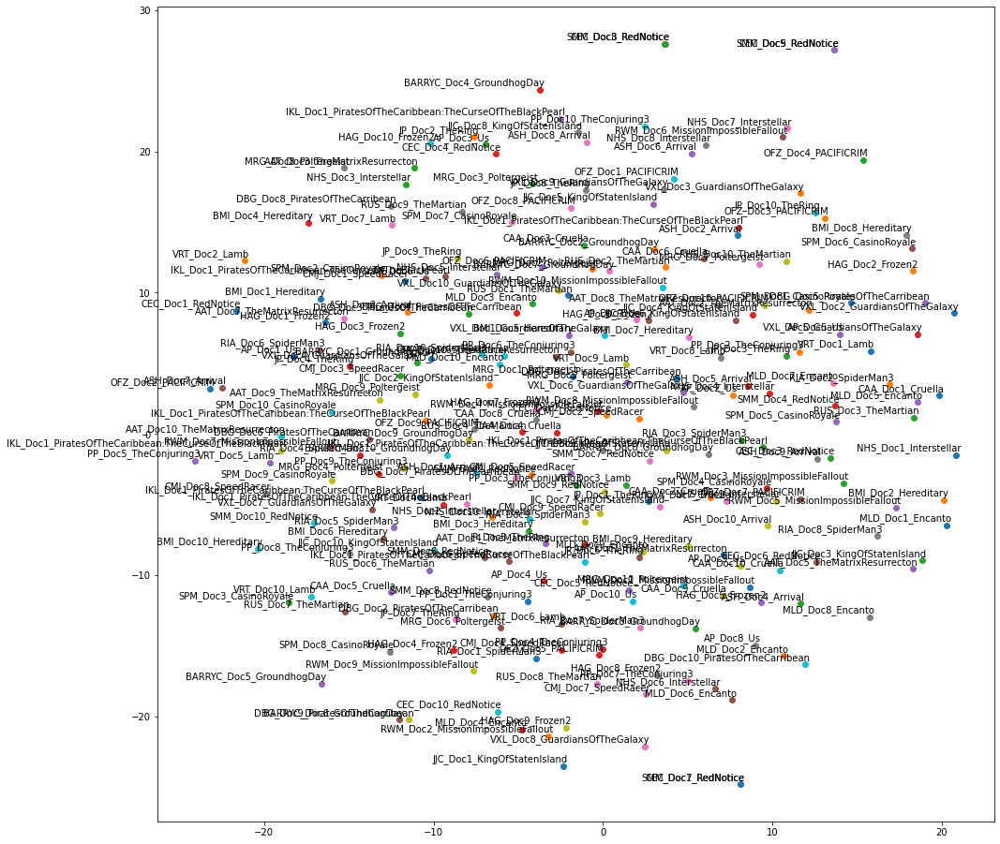

In [40]:
plot_doc2vec(doc2vec_df, titles,15)

#### Plot Heatmap of Cosine Similarity of Documents using TFIDF matrix

In [41]:
doc_term_matrix = transformed_documents.todense()
df = pd.DataFrame(doc_term_matrix, 
                      columns=vectorizer.get_feature_names(), 
                      index=docids)

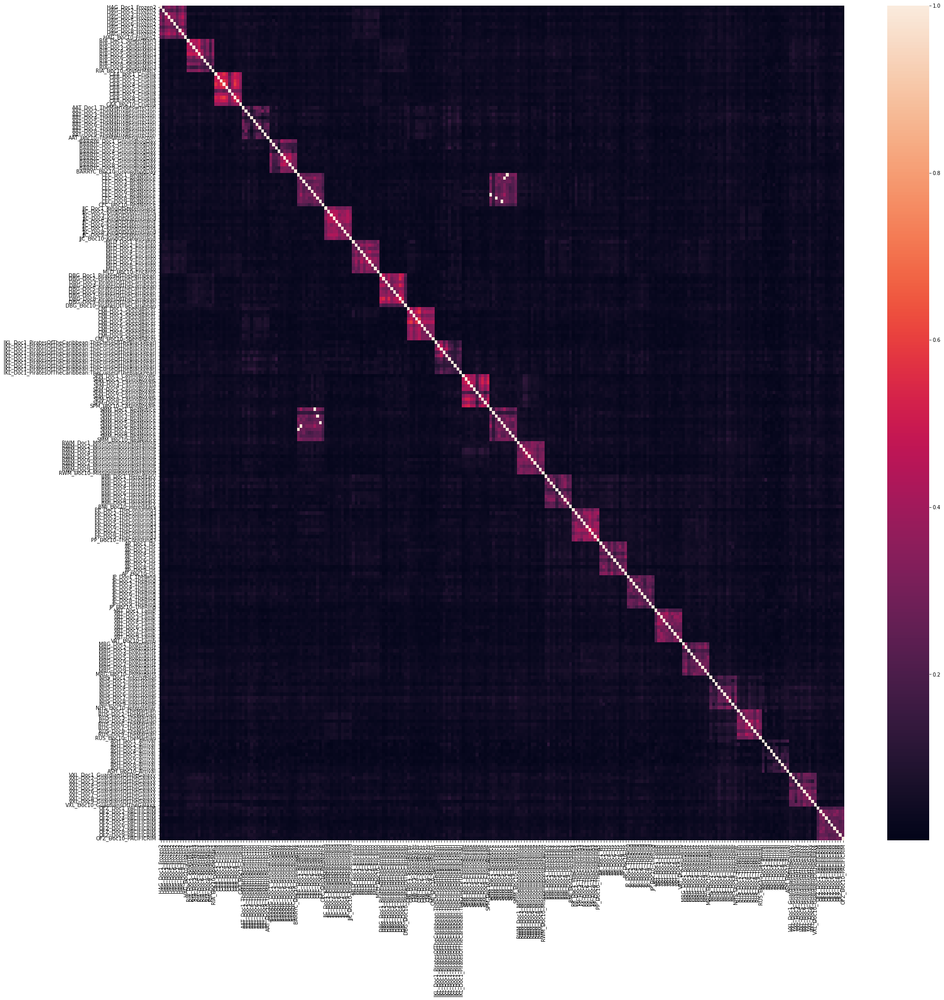

In [42]:
similarity  = cosine_similarity(df, df)
a4_dims = (30, 30)
fig, ax = pyplot.subplots(figsize=a4_dims)
sns.heatmap(ax=ax, data=similarity, xticklabels= titles, yticklabels=titles);

# Method 2 Experiments



## Data wrangling
baseline = tokenization + normalization + stemming + stop words

### Functions for pre-processing

In [43]:
def clean_doc(doc): 
    #split document into individual words
    doc = ' '.join(remove_stop_words(doc))
    doc = apply_stemming(doc)

    tokens=doc.split()
    re_punc = re.compile('[%s]' % re.escape(string.punctuation))
    # remove punctuation from each word
    tokens = [re_punc.sub('', w) for w in tokens]
    # remove remaining tokens that are not alphabetic
    #tokens = [word for word in tokens if word.isalpha()]
    # filter out short tokens
    tokens = [word for word in tokens if len(word) > 3]
    #lowercase all words
    tokens = [word.lower() for word in tokens]
    
    return tokens

### Pre-process data set

In [44]:
os.chdir('/content/drive/My Drive/Colab Notebooks/MSDS453/Assignment 1/')
path_to_file='ClassCorpus.csv'
data = pd.read_csv(path_to_file)

In [45]:
#process documents
titles, final_processed_text, processed_text = process_corpus(data)

#number of tokens
len_tokens = []
for i in final_processed_text:
  len_tokens.append(len(i))

print(sum(len_tokens))

#tokens from five random texts in the corpus
for i in np.random.randint(0,249,5):
  print(final_processed_text[i])

666661
open scene king staten island highlight judd apatow latest indulg also hint someth rest film never live track pete davidson scott drive highway face scrunch frustrat breath close cathart power film subsequ never realli film forgo real level patho even keel stori flounder fine territori true apatow overlong well mean allow come talent take reign film though case star dwarf heartfelt perform support player scott someth sunken arrest develop watch younger sister colleg pseudo girlfriend begin pursu dream outsid staten island perimet lifestyl flip head though mother wonder marissa tomei fall firefight play subtl humor loud sincer bill burr three cope relationship dynam scott deal linger feel death father also fireman also must find want life will sacrific synopsi mislead much strictli number meat potato style apatow ventur though lead cast somewhat younger might usual much film case comedi driven persona star hand davidson talent divis least stori undoubtedli profound even dilut ver

##Document Vectorization using tf-idf

### Calculates TFIDF and Saves TFIDF Values for Terms

In [46]:
vectorizer = TfidfVectorizer(stop_words='english', use_idf=True, norm=None)
transformed_documents = vectorizer.fit_transform(final_processed_text)
transformed_documents_as_array = transformed_documents.toarray()

output_dir ="TFIDF_output.csv"

if not os.path.exists(output_dir):
    os.makedirs(output_dir)

for counter, doc in enumerate(transformed_documents_as_array):
    # construct a dataframe
    tf_idf_tuples = list(zip(vectorizer.get_feature_names(), doc))
    one_doc_as_df = pd.DataFrame.from_records(tf_idf_tuples
                                              ,columns=['term', 'score']).sort_values(by='score', ascending=False).reset_index(drop=True)
    
    # output to a csv using the enumerated value for the filename
    one_doc_as_df.to_csv(output_dir+"/"+str(titles[counter]))
    

In [47]:
os.chdir('/content/drive/My Drive/Colab Notebooks/MSDS453/Assignment 1/TFIDF_output.csv/')

top_term_scores().head(10)

,Term,Score
67,ideolog,2.46
1283,guardian,2.10
1282,galaxi,1.50
1090,marvel,1.41
1384,quill,1.36
68,adult,1.35
430,prologu,1.27
412,formula,1.19
1285,ikea,1.17
592,hypocrisi,1.08


##Terms by Embedding Matrix

### 100 Embedding Dimensions

In [48]:
titles, final_processed_text, processed_text = process_corpus(data)
labels, tokens, word2vec_model = run_word2vec(processed_text, 100)

#### Plot word2vec TSNE

In [49]:
#create random subset of 100 tokens
weights = []

random_labels = random.sample(labels, 100)

for i in random_labels:
  weights.append(word2vec_model[i])

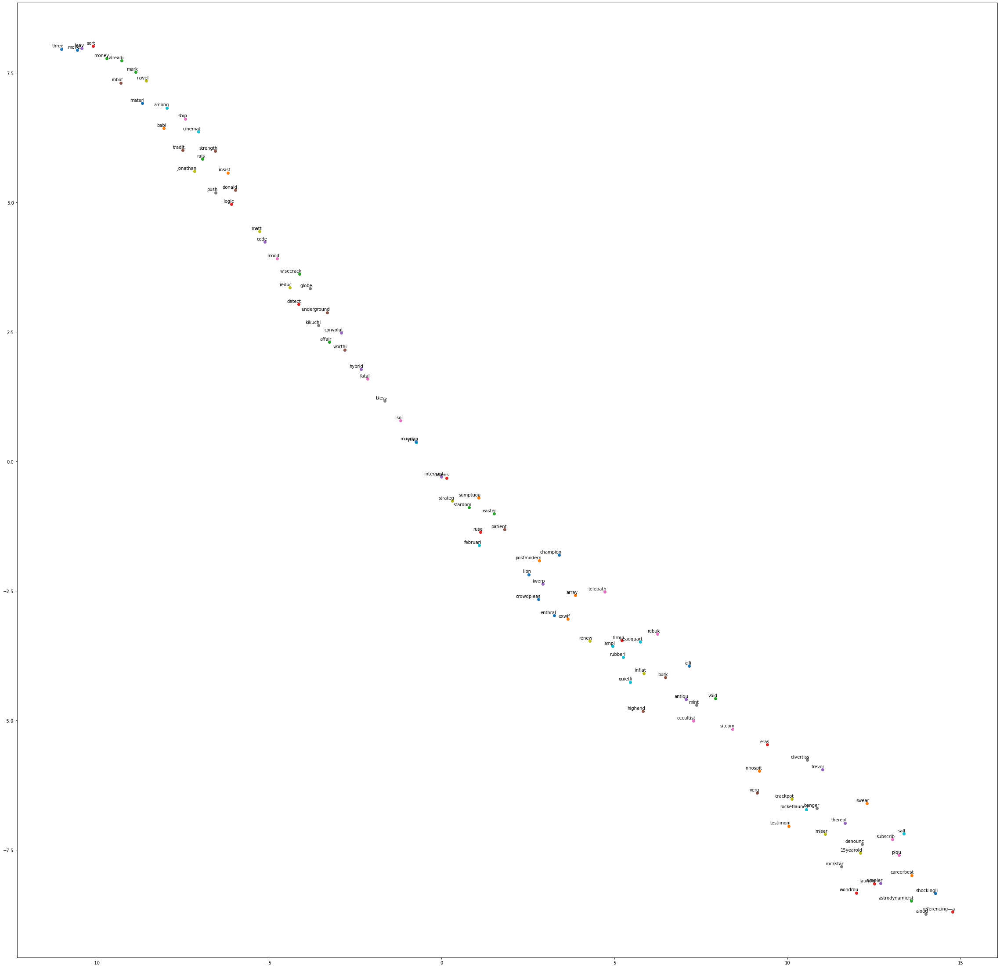

CPU times: user 2.68 s, sys: 145 ms, total: 2.83 s
Wall time: 2.35 s


In [50]:
%%time
plot_word2vec(word2vec_model, random_labels, weights, 20)

#### Plot word2vec heatmap for cosine similarity

In [51]:
df = pd.DataFrame(weights, index=random_labels)
df.head()

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,...,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99
elli,-0.008957,0.019550,-0.015892,0.000089,0.003405,-0.007442,0.016034,0.014317,0.002985,-0.000691,-0.003558,0.011625,-0.003666,-0.019504,0.003230,0.008431,-0.009761,-0.001325,0.009032,0.005246,-0.033730,-0.003685,0.025373,-0.000047,0.004024,0.003494,-0.012258,-0.030800,-0.015469,0.015111,0.022956,0.013436,0.015725,0.017040,0.004663,-0.030848,0.016507,-0.006353,0.025486,0.010793,...,0.003112,-0.007986,0.005133,-0.017816,-0.001966,-0.000874,-0.018684,0.025085,-0.009740,0.011444,0.008134,-0.000458,-0.027597,-0.006152,0.013714,-0.002393,-0.014933,0.022912,-0.013257,-0.030500,-0.012875,-0.024616,0.021704,-0.007548,0.005120,-0.000508,-0.019274,0.006067,0.012859,-0.015799,0.023955,0.012373,0.009744,-0.012234,-0.006271,-0.005020,0.017692,-0.034647,0.010978,-0.025155
postmodern,-0.007978,0.024005,-0.015447,0.007730,0.013306,-0.012406,0.021176,0.017052,0.001912,-0.000205,-0.008010,0.012032,-0.004813,-0.017910,0.005322,0.012559,-0.018727,0.001025,0.016673,0.003723,-0.045420,-0.003630,0.031179,-0.001248,0.007245,0.014123,-0.025363,-0.036749,-0.014861,0.016516,0.024782,0.022435,0.023162,0.015907,0.001660,-0.035584,0.019404,-0.002008,0.042828,0.023889,...,0.008183,-0.010545,0.013071,-0.016564,-0.011776,-0.002357,-0.026715,0.023394,-0.017684,0.005757,0.013063,0.000429,-0.045827,-0.001047,0.021294,0.000788,-0.010242,0.039170,-0.015433,-0.040739,-0.020175,-0.026147,0.033493,-0.007171,0.011242,0.002625,-0.028753,0.009660,0.020604,-0.012671,0.033147,0.012340,0.018575,-0.012411,-0.012934,-0.005678,0.023670,-0.042098,0.012425,-0.023401
money,-0.120536,0.228816,-0.173167,0.046869,0.104313,-0.129325,0.199149,0.180171,0.068345,0.001003,-0.083594,0.154899,-0.053519,-0.231792,0.097996,0.164861,-0.196315,-0.004515,0.184137,0.031862,-0.507147,0.003258,0.367833,-0.047607,0.090659,0.106377,-0.240745,-0.440608,-0.167341,0.164907,0.294853,0.203586,0.214610,0.208520,0.054364,-0.409218,0.256411,-0.030068,0.427190,0.210743,...,0.055078,-0.065810,0.106255,-0.209528,-0.080501,-0.079045,-0.310363,0.298865,-0.147163,0.112318,0.192584,-0.044718,-0.464965,-0.044446,0.183155,0.011171,-0.146277,0.383804,-0.203808,-0.498693,-0.226372,-0.337902,0.330119,-0.088154,0.128394,0.046507,-0.301847,0.118886,0.181821,-0.173392,0.316982,0.109037,0.215216,-0.116778,-0.123067,-0.056656,0.262207,-0.459328,0.112664,-0.310014
eras,-0.002534,0.013358,-0.005958,0.002023,0.006877,-0.012069,0.015717,0.006249,0.006917,-0.000125,-0.007234,0.012045,-0.003769,-0.017933,0.007075,0.013940,-0.013307,0.001066,0.013780,-0.001167,-0.027259,-0.003845,0.021948,-0.001275,0.004714,0.005335,-0.010243,-0.022624,-0.009102,0.011491,0.019983,0.015589,0.016842,0.009002,0.007141,-0.021674,0.016956,-0.000738,0.020995,0.010220,...,0.002208,-0.000914,0.006343,-0.015441,-0.002456,-0.008986,-0.014299,0.013708,-0.013497,0.009654,0.013401,-0.000297,-0.031208,-0.002717,0.007606,-0.002873,-0.013435,0.019154,-0.010508,-0.026354,-0.014676,-0.020288,0.018813,-0.009505,0.011231,0.007131,-0.020595,0.006451,0.014051,-0.007415,0.018537,0.011214,0.011469,-0.010092,-0.003392,-0.000600,0.011975,-0.027488,0.008798,-0.015133
hybrid,-0.022325,0.045289,-0.031458,0.010868,0.017541,-0.027015,0.036438,0.036633,0.014778,0.004484,-0.019146,0.024364,-0.007302,-0.045614,0.016870,0.028357,-0.039150,-0.003023,0.029275,0.009395,-0.097793,-0.003003,0.069882,-0.006940,0.019772,0.025063,-0.039923,-0.081458,-0.028074,0.029991,0.058415,0.036482,0.040766,0.036041,0.005750,-0.078349,0.041835,-0.010062,0.075819,0.036890,...,0.009431,-0.008788,0.015438,-0.038038,-0.011088,-0.009445,-0.057144,0.051023,-0.022190,0.020447,0.035033,-0.005211,-0.081924,-0.003206,0.033162,0.003249,-0.029852,0.071271,-0.040254,-0.096196,-0.038774,-0.061522,0.061526,-0.021373,0.018409,0.012407,-0.057528,0.026169,0.028848,-0.026928,0.057336,0.02

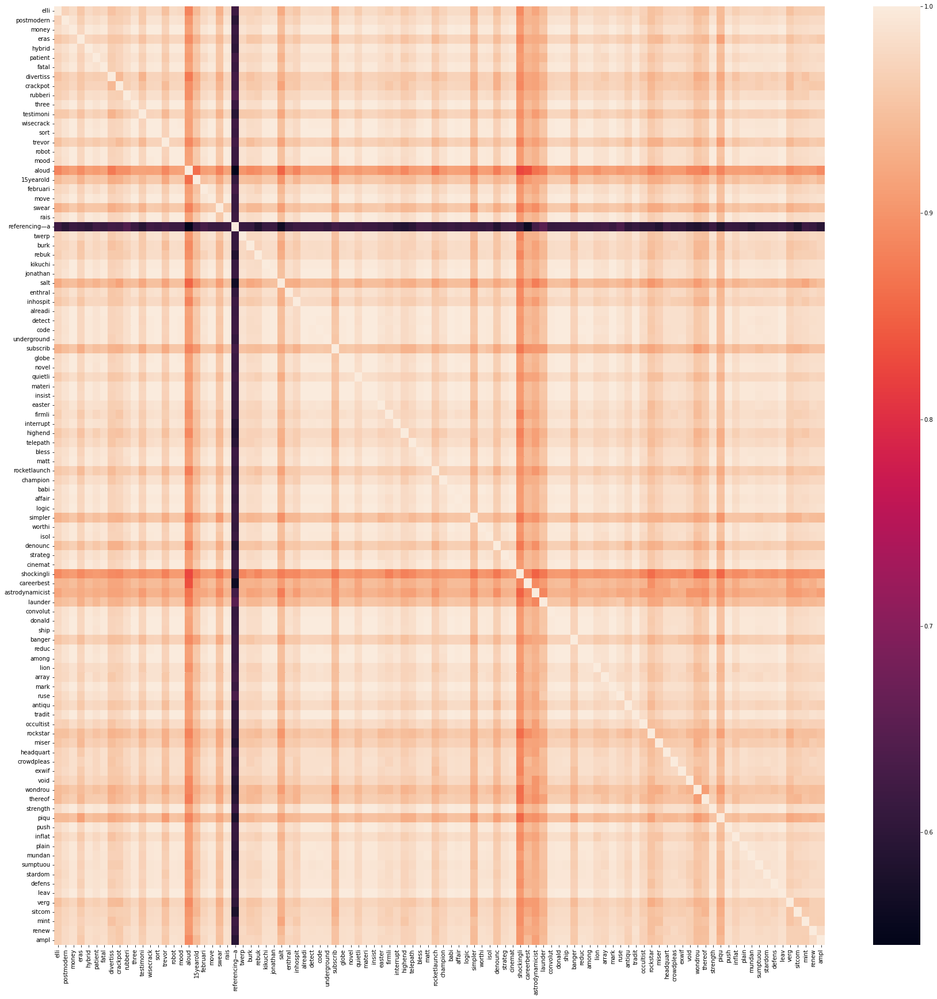

In [52]:
similarity  = cosine_similarity(df, df)
a4_dims = (30, 30)
fig, ax = pyplot.subplots(figsize=a4_dims)
sns.heatmap(ax=ax, data=similarity, xticklabels=random_labels, yticklabels=random_labels);

### 200 Embedding Dimensions

In [53]:
titles, final_processed_text, processed_text = process_corpus(data)
labels, tokens, word2vec_model = run_word2vec(processed_text, 200)

#### Plot word2vec TSNE

In [54]:
#create random subset of 100 tokens
weights = []

random_labels = random.sample(labels, 100)

for i in random_labels:
  weights.append(word2vec_model[i])

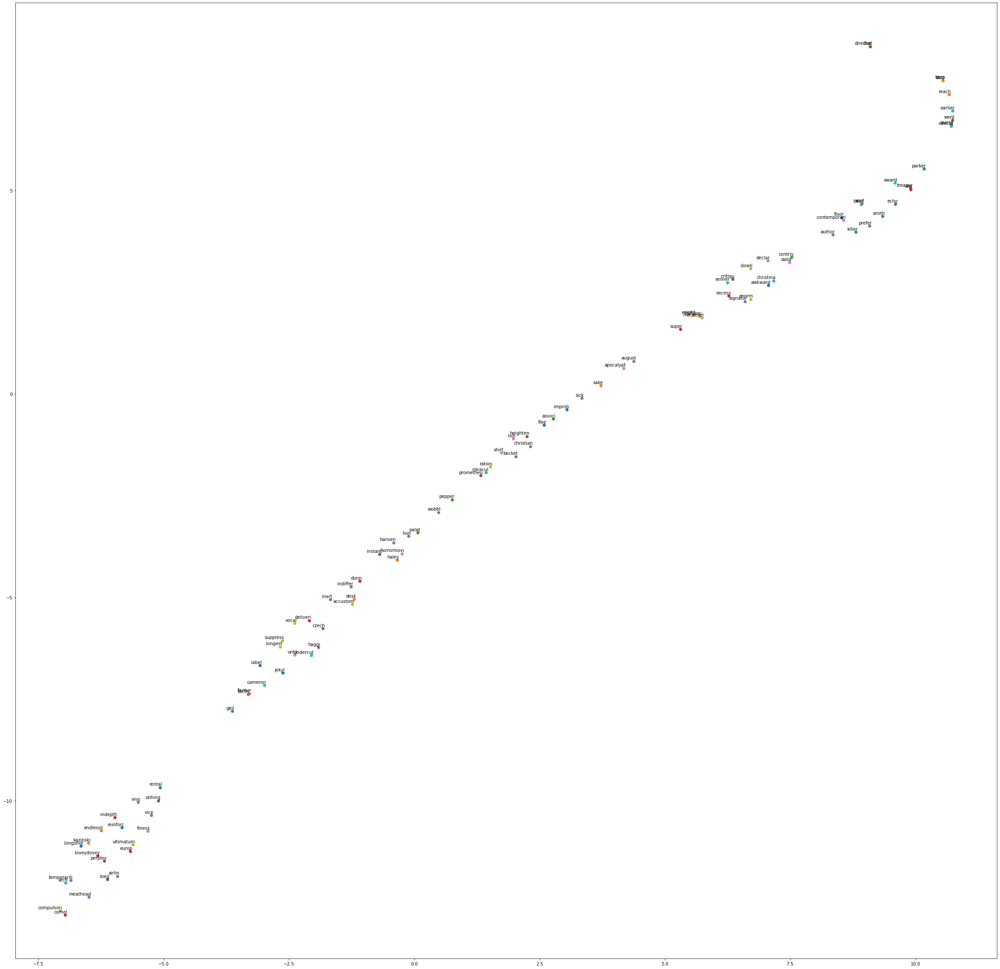

CPU times: user 2.59 s, sys: 122 ms, total: 2.71 s
Wall time: 2.16 s


In [55]:
%%time
plot_word2vec(word2vec_model, random_labels, weights, 20)

#### Plot word2vec heatmap for cosine similarity

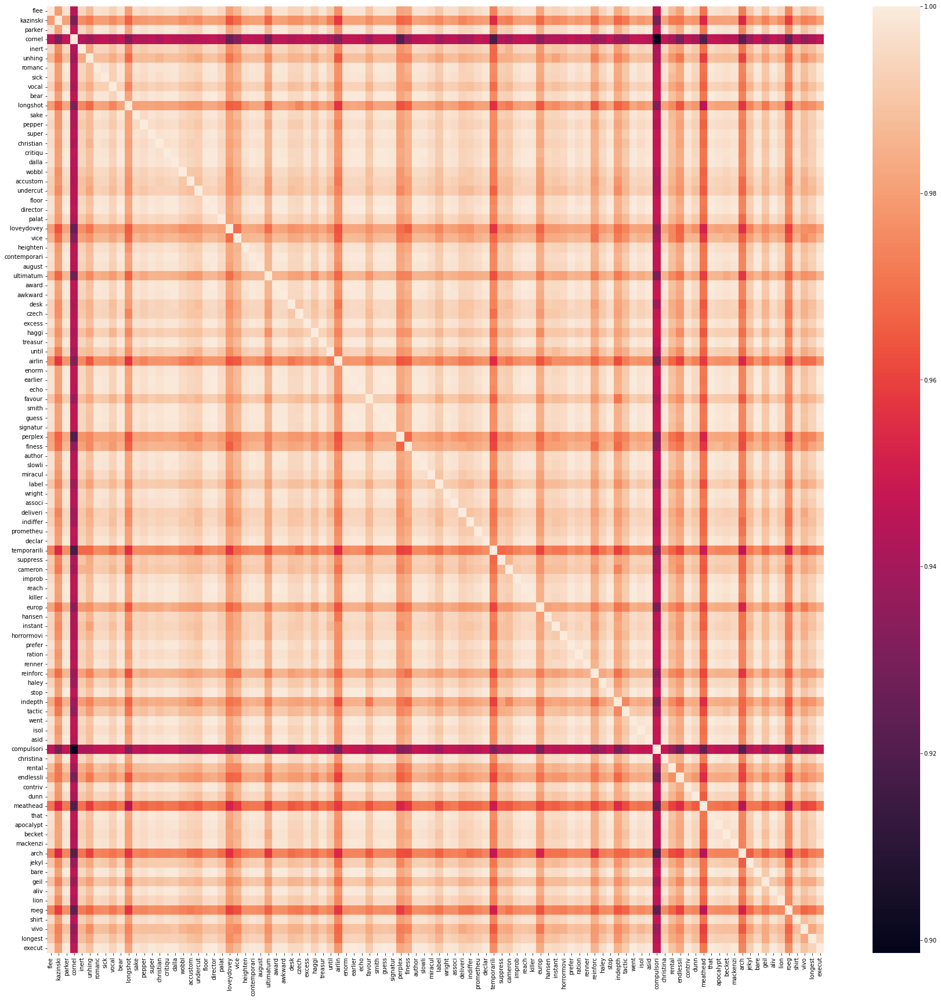

In [56]:
df = pd.DataFrame(weights, index=random_labels)

similarity  = cosine_similarity(df, df)
a4_dims = (30, 30)
fig, ax = pyplot.subplots(figsize=a4_dims)
sns.heatmap(ax=ax, data=similarity, xticklabels=random_labels, yticklabels=random_labels);

### 300 Embedding Dimensions

In [57]:
titles, final_processed_text, processed_text = process_corpus(data)
labels, tokens, word2vec_model = run_word2vec(processed_text, 300)

#### Plot word2vec TSNE

In [58]:
#create random subset of 100 tokens
weights = []

random_labels = random.sample(labels, 100)

for i in random_labels:
  weights.append(word2vec_model[i])

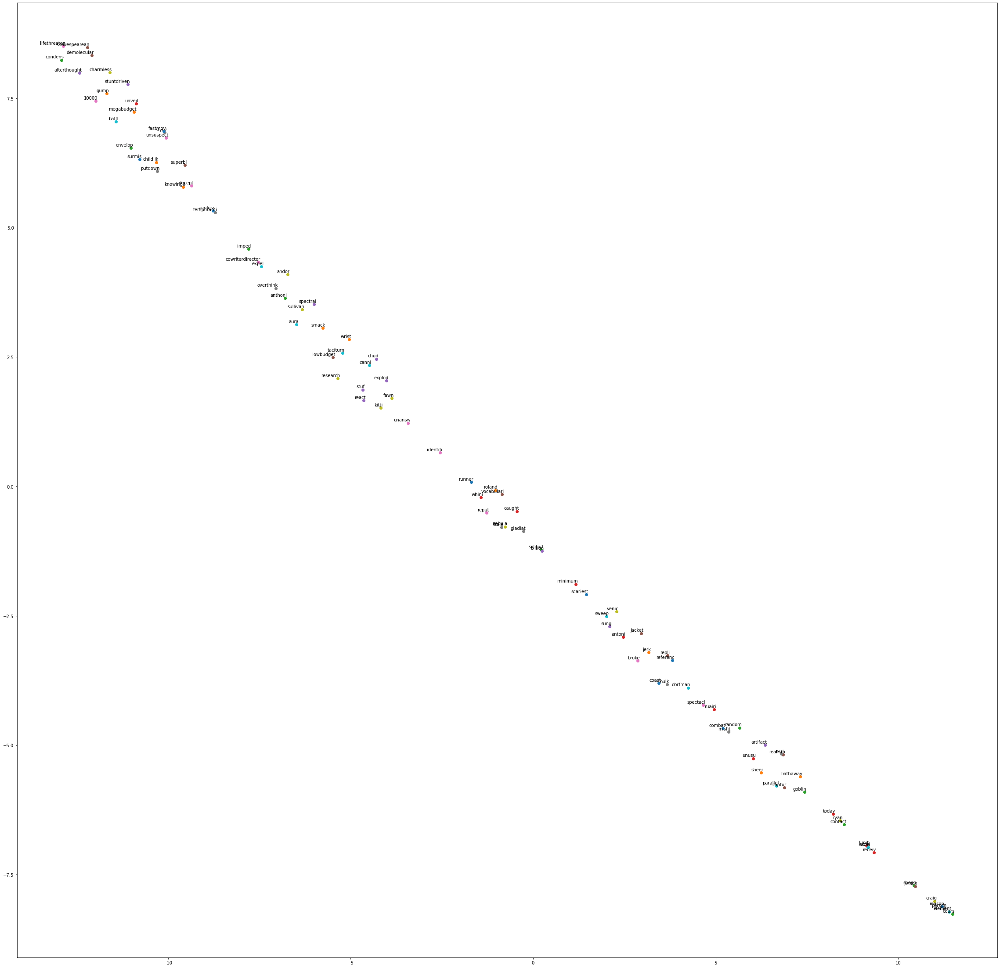

CPU times: user 2.53 s, sys: 159 ms, total: 2.69 s
Wall time: 2.23 s


In [59]:
%%time
plot_word2vec(word2vec_model, random_labels, weights, 20)

#### Plot word2vec heatmap for cosine similarity

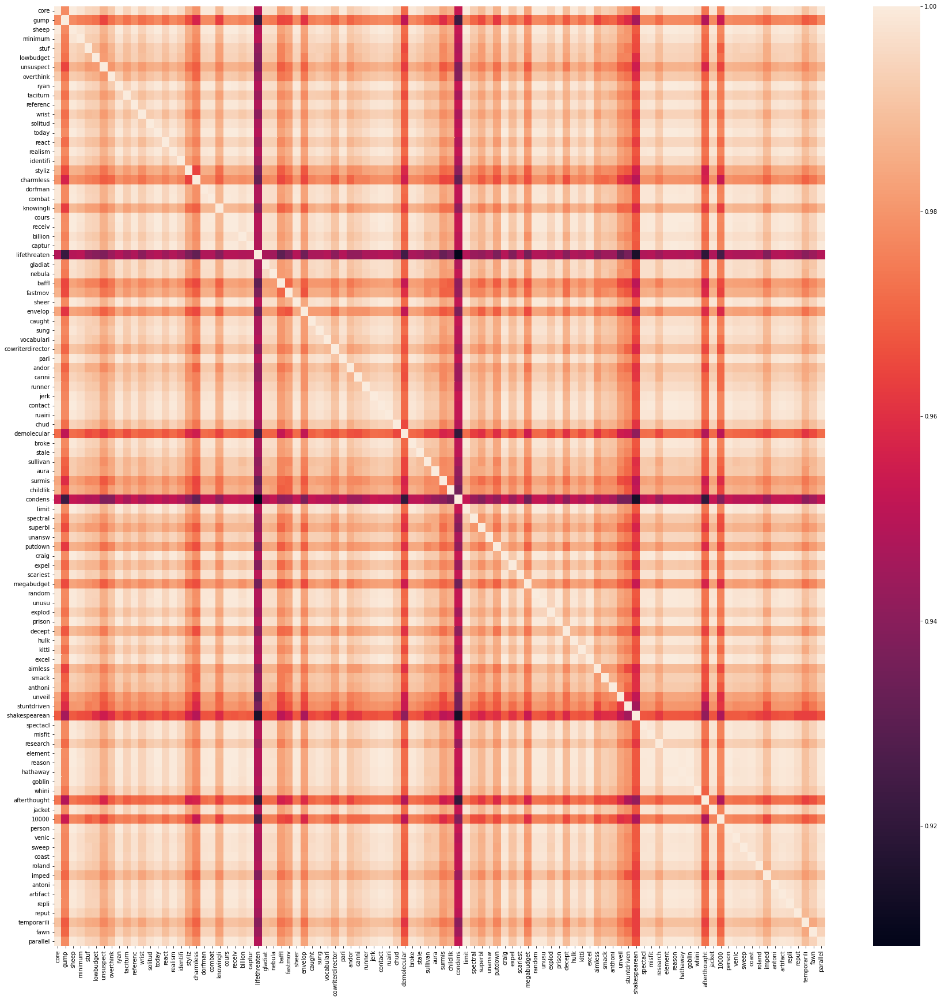

In [60]:
df = pd.DataFrame(weights, index=random_labels)

similarity  = cosine_similarity(df, df)
a4_dims = (30, 30)
fig, ax = pyplot.subplots(figsize=a4_dims)
sns.heatmap(ax=ax, data=similarity, xticklabels=random_labels, yticklabels=random_labels);

## Documents by Embedding Matrix

### 100 Embedding Dimensions

In [61]:
doc2vec_df = run_doc2vec(final_processed_text, processed_text, 100)

#### Plot doc2vec TSNE 

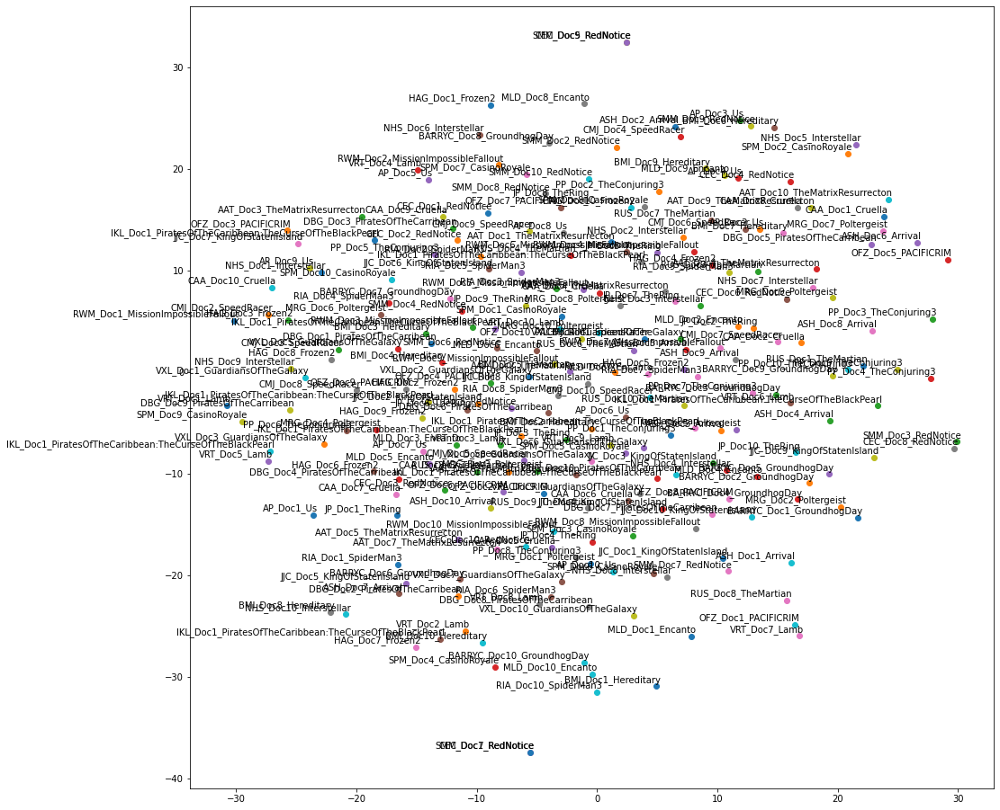

In [62]:
plot_doc2vec(doc2vec_df, titles,15)

#### Plot Heatmap of Cosine Similarity of Documents using TFIDF matrix

In [63]:
doc_term_matrix = transformed_documents.todense()
df = pd.DataFrame(doc_term_matrix, 
                      columns=vectorizer.get_feature_names(), 
                      index=docids)

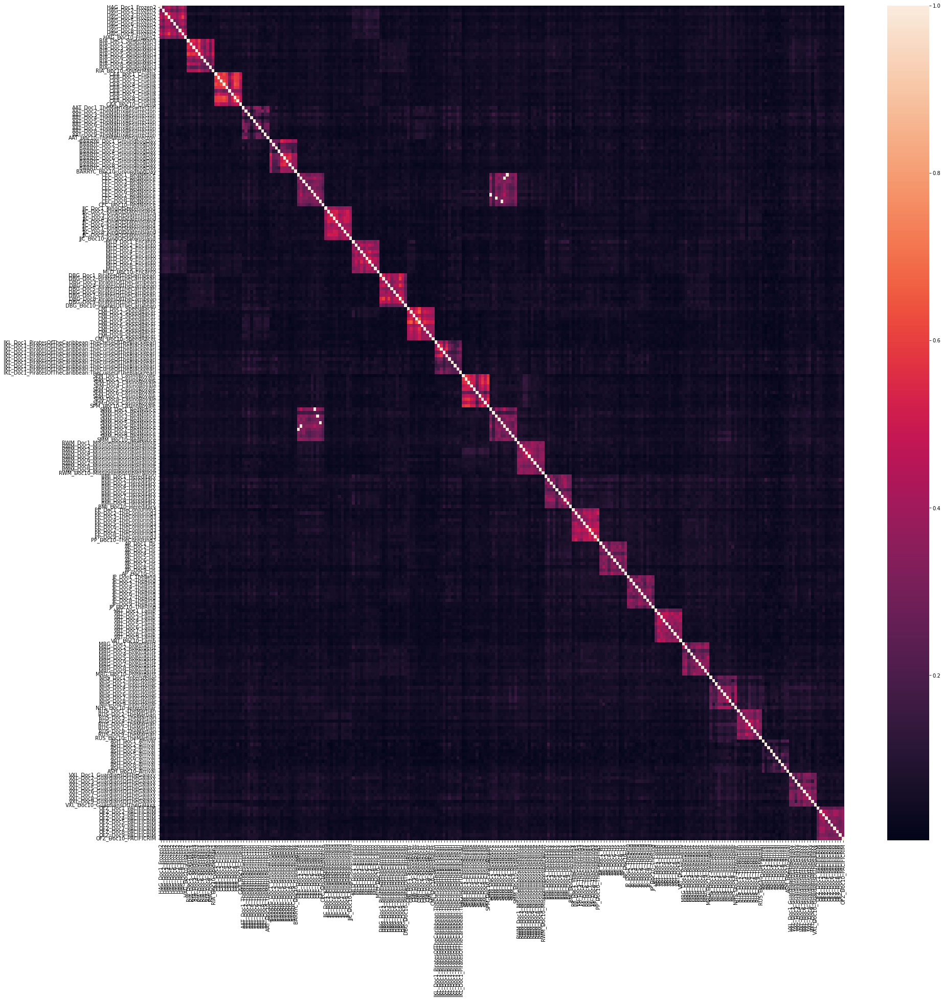

In [64]:
similarity  = cosine_similarity(df, df)
a4_dims = (30, 30)
fig, ax = pyplot.subplots(figsize=a4_dims)
sns.heatmap(ax=ax, data=similarity, xticklabels= titles, yticklabels=titles);

### 200 Embedding Dimensions

In [65]:
doc2vec_df = run_doc2vec(final_processed_text, processed_text, 200)

#### Plot doc2vec TSNE 

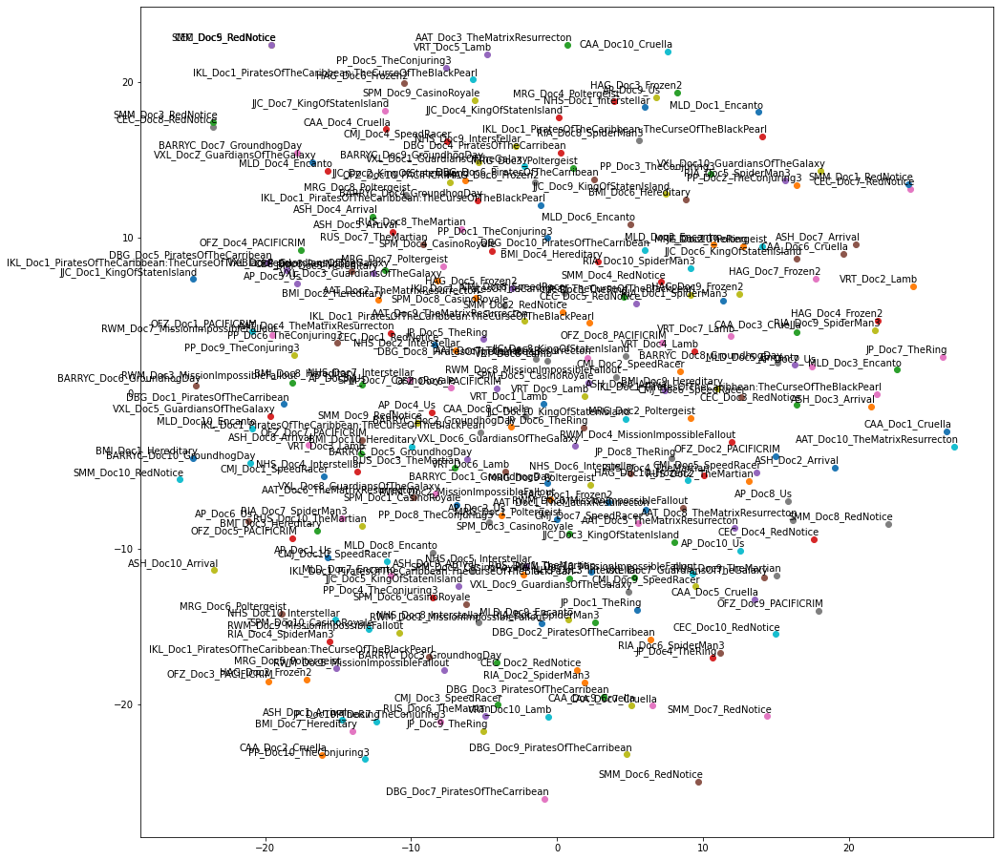

In [66]:
plot_doc2vec(doc2vec_df, titles,15)

#### Plot Heatmap of Cosine Similarity of Documents using TFIDF matrix

In [67]:
doc_term_matrix = transformed_documents.todense()
df = pd.DataFrame(doc_term_matrix, 
                      columns=vectorizer.get_feature_names(), 
                      index=docids)

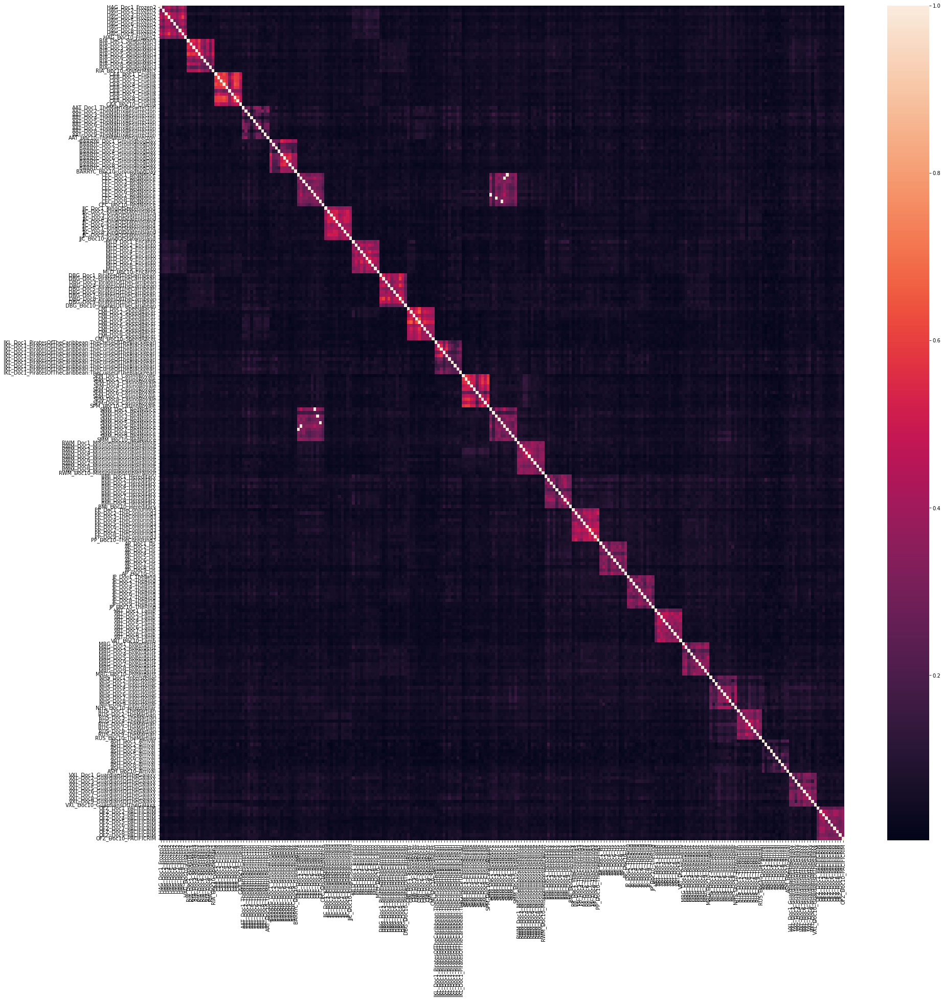

In [68]:
similarity  = cosine_similarity(df, df)
a4_dims = (30, 30)
fig, ax = pyplot.subplots(figsize=a4_dims)
sns.heatmap(ax=ax, data=similarity, xticklabels= titles, yticklabels=titles);

### 300 Embedding Dimensions

In [69]:
doc2vec_df = run_doc2vec(final_processed_text, processed_text, 300)

#### Plot doc2vec TSNE 

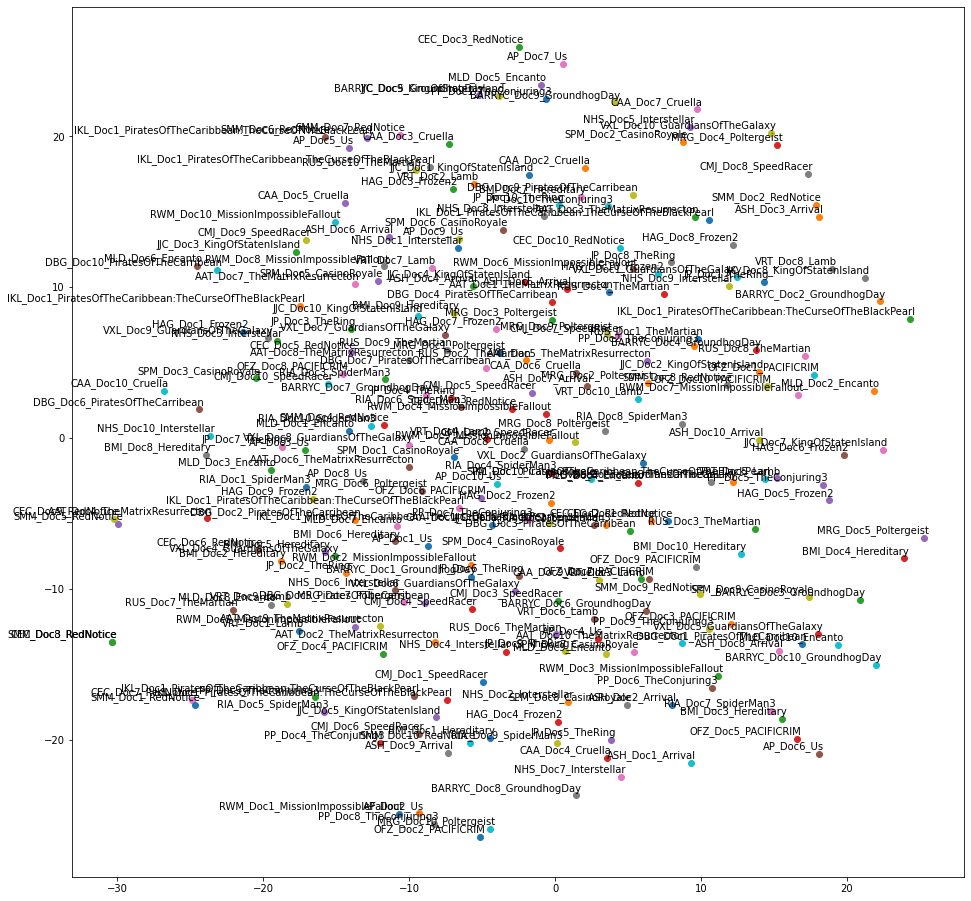

In [70]:
plot_doc2vec(doc2vec_df, titles,15)

#### Plot Heatmap of Cosine Similarity of Documents using TFIDF matrix

In [71]:
doc_term_matrix = transformed_documents.todense()
df = pd.DataFrame(doc_term_matrix, 
                      columns=vectorizer.get_feature_names(), 
                      index=docids)

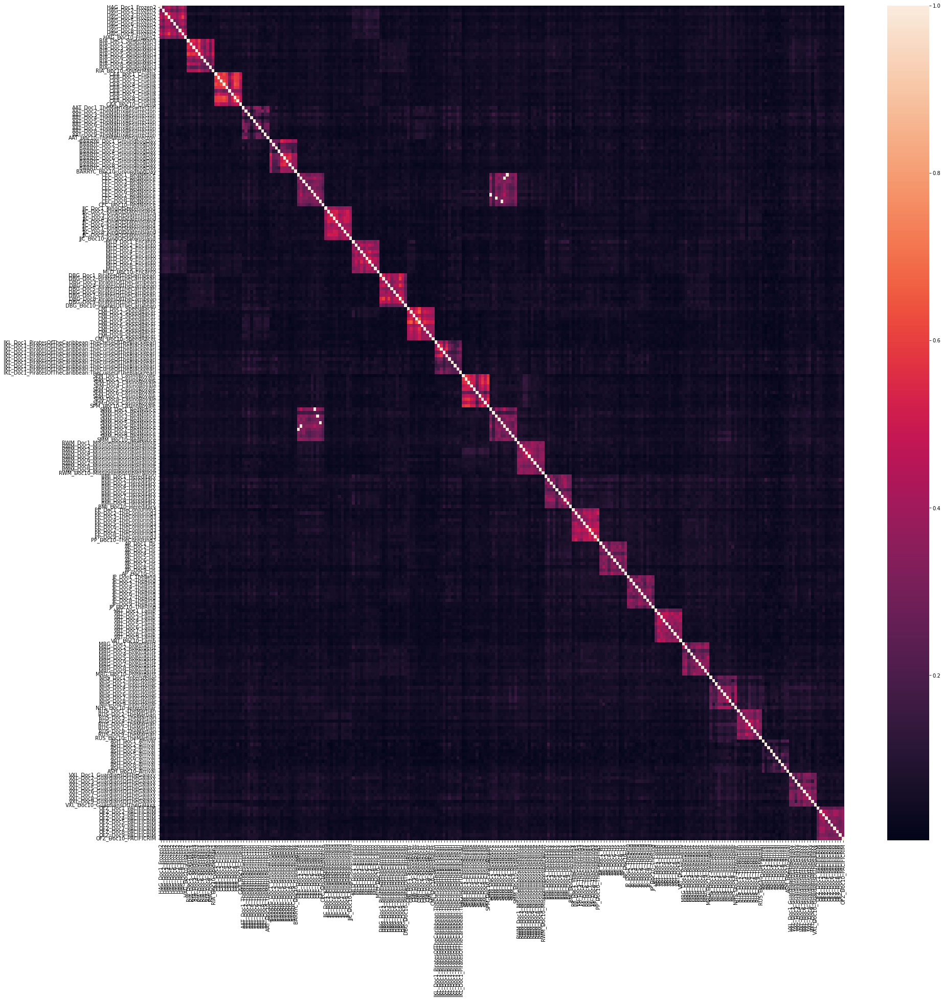

In [72]:
similarity  = cosine_similarity(df, df)
a4_dims = (30, 30)
fig, ax = pyplot.subplots(figsize=a4_dims)
sns.heatmap(ax=ax, data=similarity, xticklabels= titles, yticklabels=titles);

# Method 3 Experiments



## Data wrangling
baseline = tokenization + normalization + lemmatization + stop words + remove non-alphabetic tokens

### Functions for pre-processing

In [73]:
def clean_doc(doc): 
    #split document into individual words
    doc = ' '.join(remove_stop_words(doc))
    doc = apply_lemmatization(doc)

    tokens=doc.split()
    re_punc = re.compile('[%s]' % re.escape(string.punctuation))
    # remove punctuation from each word
    tokens = [re_punc.sub('', w) for w in tokens]
    # remove remaining tokens that are not alphabetic
    tokens = [word for word in tokens if word.isalpha()]
    # filter out short tokens
    tokens = [word for word in tokens if len(word) > 3]
    #lowercase all words
    tokens = [word.lower() for word in tokens]
    
    return tokens

### Pre-process data set

In [74]:
os.chdir('/content/drive/My Drive/Colab Notebooks/MSDS453/Assignment 1/')
path_to_file='ClassCorpus.csv'
data = pd.read_csv(path_to_file)

In [75]:
#process documents
titles, final_processed_text, processed_text = process_corpus(data)

#number of tokens
len_tokens = []
for i in final_processed_text:
  len_tokens.append(len(i))

print(sum(len_tokens))

#tokens from five random texts in the corpus
for i in np.random.randint(0,249,5):
  print(final_processed_text[i])

751261
although office remained strong worldwide even ardent james bond series felt series reached creative last film starring pierce brosnan world enough another though slump back tomorrow never dies seemed better bond aficionado last film liked series first brosnan bonds goldeneye happens last film original bond producer albert cubby broccoli input although uncredited shape form cubby died quality series headed south quickly despite remaining highly profitable cubby clearly major creative force behind bond franchise made work subsequent bond film cubby death produced stepson michael wilson daughter barbara broccoli collaborated several film father dating back late early cubby gone magic gone well casino royale fleming first novel published england back previously made godawful allstar comedy spoof went five director credited screenwriter also featured great musical score burt bacharach there even earlier version book published actor barry nelson hand overlook hotel jack nicholson sta

##Document Vectorization using tf-idf

### Calculates TFIDF and Saves TFIDF Values for Terms

In [76]:
vectorizer = TfidfVectorizer(stop_words='english', use_idf=True, norm=None)
transformed_documents = vectorizer.fit_transform(final_processed_text)
transformed_documents_as_array = transformed_documents.toarray()

output_dir ="TFIDF_output.csv"

if not os.path.exists(output_dir):
    os.makedirs(output_dir)

for counter, doc in enumerate(transformed_documents_as_array):
    # construct a dataframe
    tf_idf_tuples = list(zip(vectorizer.get_feature_names(), doc))
    one_doc_as_df = pd.DataFrame.from_records(tf_idf_tuples
                                              ,columns=['term', 'score']).sort_values(by='score', ascending=False).reset_index(drop=True)
    
    # output to a csv using the enumerated value for the filename
    one_doc_as_df.to_csv(output_dir+"/"+str(titles[counter]))
    

In [77]:
os.chdir('/content/drive/My Drive/Colab Notebooks/MSDS453/Assignment 1/TFIDF_output.csv/')

top_term_scores().head(10)

,Term,Score
85,ideological,2.05
1441,guardians,1.82
1440,galaxy,1.50
86,formulaic,1.47
1243,marvel,1.46
1566,quill,1.36
87,adult,1.35
522,prologue,1.27
278,flying,1.27
1443,ikea,1.17


##Terms by Embedding Matrix

### 100 Embedding Dimensions

In [78]:
titles, final_processed_text, processed_text = process_corpus(data)
labels, tokens, word2vec_model = run_word2vec(processed_text, 100)

#### Plot word2vec TSNE

In [79]:
#create random subset of 100 tokens
weights = []

random_labels = random.sample(labels, 100)

for i in random_labels:
  weights.append(word2vec_model[i])

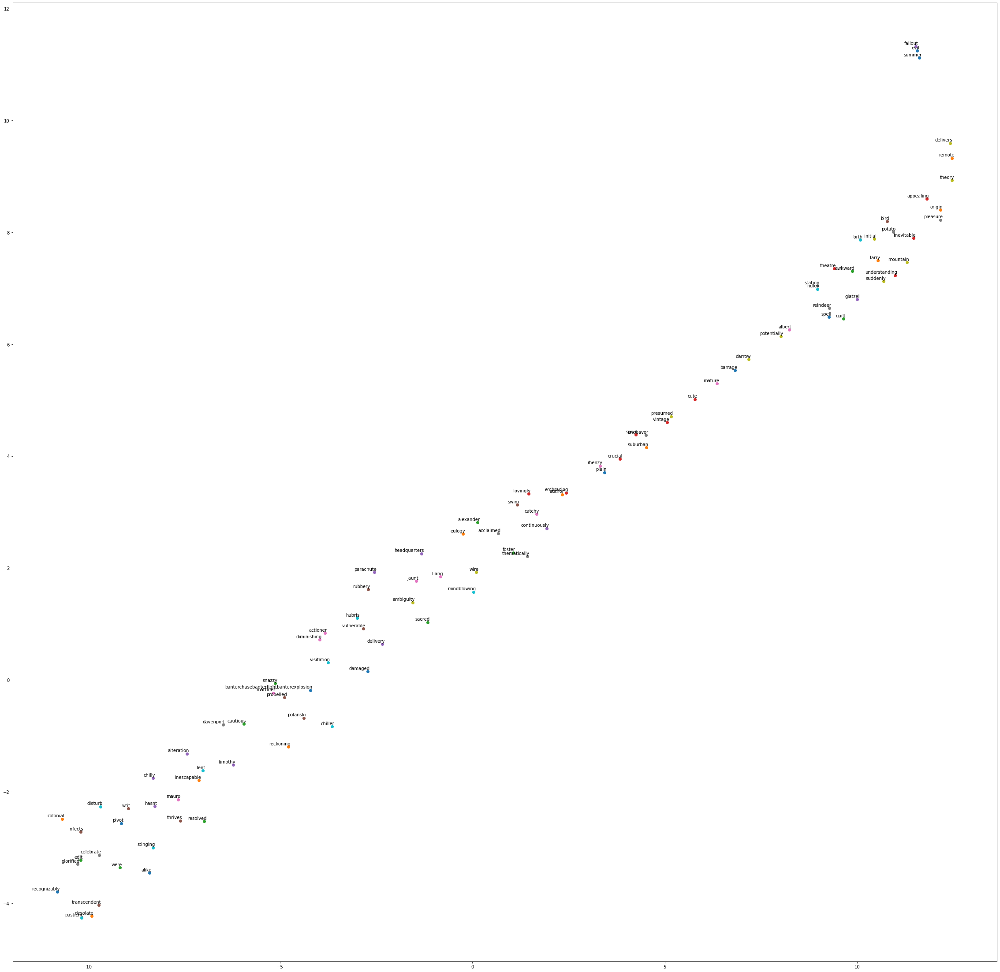

CPU times: user 2.63 s, sys: 143 ms, total: 2.77 s
Wall time: 2.19 s


In [80]:
%%time
plot_word2vec(word2vec_model, random_labels, weights, 20)

#### Plot word2vec heatmap for cosine similarity

In [81]:
df = pd.DataFrame(weights, index=random_labels)
df.head()

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,...,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99
pivot,-0.000151,0.012518,-0.008745,-0.010063,-0.004969,-0.007104,0.006502,0.014104,0.006404,0.003202,0.004837,0.011235,-0.006528,0.002718,-0.000051,-0.002766,-0.001015,-0.001606,-0.003209,-0.002528,-0.005780,-0.005942,-0.000376,-0.001774,0.008413,0.000384,-0.000633,-0.010701,-0.015977,-0.001683,0.012935,0.007778,-0.000180,0.006251,0.008766,-0.010597,-0.001369,0.001062,0.006327,-0.001022,...,0.005722,0.002457,0.006385,-0.003359,0.002233,-0.005030,0.010774,-0.002947,0.003515,-0.005030,0.001859,0.001405,-0.008837,-0.003272,0.010301,-0.010094,0.007338,0.008242,-0.008442,-0.012394,-0.008831,-0.010809,0.010856,0.001497,0.004844,0.006481,-0.000806,0.001142,0.014504,-0.005430,0.012008,0.007020,-0.002186,0.003425,-0.003754,0.002616,0.004330,0.000034,0.001787,-0.002806
desolate,0.000869,0.002667,-0.005175,-0.005184,0.000832,-0.006024,0.008309,0.008860,0.002037,0.001324,0.005560,0.003130,-0.001597,-0.005084,0.004480,0.003488,0.004647,-0.002075,0.003587,-0.001419,-0.004782,-0.004056,0.002625,-0.002750,0.009935,0.001159,-0.003032,-0.005568,-0.008832,0.001934,0.009467,0.009247,0.000432,0.001991,0.007681,-0.005446,-0.000896,0.004409,0.005296,-0.003547,...,0.002684,0.000477,0.000673,-0.003814,0.007432,-0.008177,0.004885,-0.003441,0.003776,-0.000483,0.001970,-0.003820,-0.001191,-0.002225,0.006885,-0.004344,0.002747,-0.001580,-0.002423,-0.007903,-0.009963,-0.007245,0.005311,0.004441,0.005236,-0.000340,-0.008569,-0.001282,0.012248,-0.007081,0.013396,-0.002925,0.004750,-0.004701,0.004451,0.000694,0.009644,0.000453,0.008704,-0.007841
were,-0.002087,0.009456,-0.004071,-0.014111,-0.005366,-0.003202,0.006931,0.009169,0.004584,0.003537,-0.001333,0.009429,-0.002981,-0.000005,0.006856,-0.003288,0.003414,-0.000092,0.003149,-0.001053,-0.006270,-0.004718,-0.002142,-0.004248,0.007289,0.000493,0.001112,-0.006096,-0.015511,0.006030,0.007027,0.014994,0.005114,0.003233,0.008285,-0.012218,0.000259,0.001529,0.003200,-0.002599,...,0.005432,0.003198,0.007643,-0.001754,0.005008,-0.006686,0.009703,0.003019,0.004147,0.000055,0.000448,-0.003988,-0.006220,-0.004234,0.005286,-0.005939,-0.000448,0.004308,-0.006169,-0.014039,-0.007849,-0.016116,0.009621,-0.003150,0.006936,0.009146,-0.008781,-0.002054,0.012983,-0.004499,0.016621,0.002608,-0.000674,0.001924,0.005014,0.007948,0.011930,-0.000218,0.004252,-0.004166
theatre,0.005032,0.063699,-0.054178,-0.063308,-0.002877,-0.023263,0.050199,0.056976,0.031071,-0.003804,0.011061,0.041725,-0.034177,-0.010457,0.023091,-0.000146,0.001208,-0.001088,0.008216,-0.013211,-0.034509,-0.005565,0.019256,0.003130,0.052383,0.021537,0.000030,-0.048153,-0.076775,0.003691,0.053699,0.068064,0.026021,0.014307,0.023555,-0.069956,0.009147,0.017947,0.025195,0.009343,...,0.023130,-0.000122,0.020141,-0.032399,0.032498,-0.037832,0.040810,0.001730,0.003624,-0.027405,0.004992,-0.001372,-0.037590,-0.016543,0.049782,-0.038912,0.016839,0.023227,-0.056839,-0.059592,-0.070228,-0.077924,0.062737,0.003643,0.012145,0.044562,-0.028642,-0.001642,0.070436,-0.047186,0.080053,0.018191,0.010590,-0.002548,0.005373,0.031814,0.054858,-0.014508,0.038841,-0.036338
hasnt,0.001594,0.007571,-0.007250,-0.013199,-0.001375,0.000305,0.012099,0.006596,0.009307,-0.001573,-0.003390,0.002631,-0.004899,-0.001118,0.009167,0.000335,0.000668,-0.001109,0.002282,-0.001283,-0.003075,-0.003836,0.000543,0.002753,0.012710,0.004930,-0.001414,-0.011275,-0.010762,0.002928,0.005300,0.014124,0.003743,-0.000960,0.007188,-0.015096,-0.001798,0.006036,0.004691,0.004396,...,0.004851,-0.004447,0.001859,-0.005900,0.005652,-0.010223,0.010704,-0.002425,0.000614,-0.005272,-0.001579,-0.000085,-0.011503,-0.004050,0.005550,-0.009107,0.004972,0.009149,-0.014452,-0.005615,-0.012123,-0.008472,0.012538,0.006112,-0.001976,0.003914,-0.008174,-0.001351,0.013648,-0.009773,0.015832,0.002851,0.

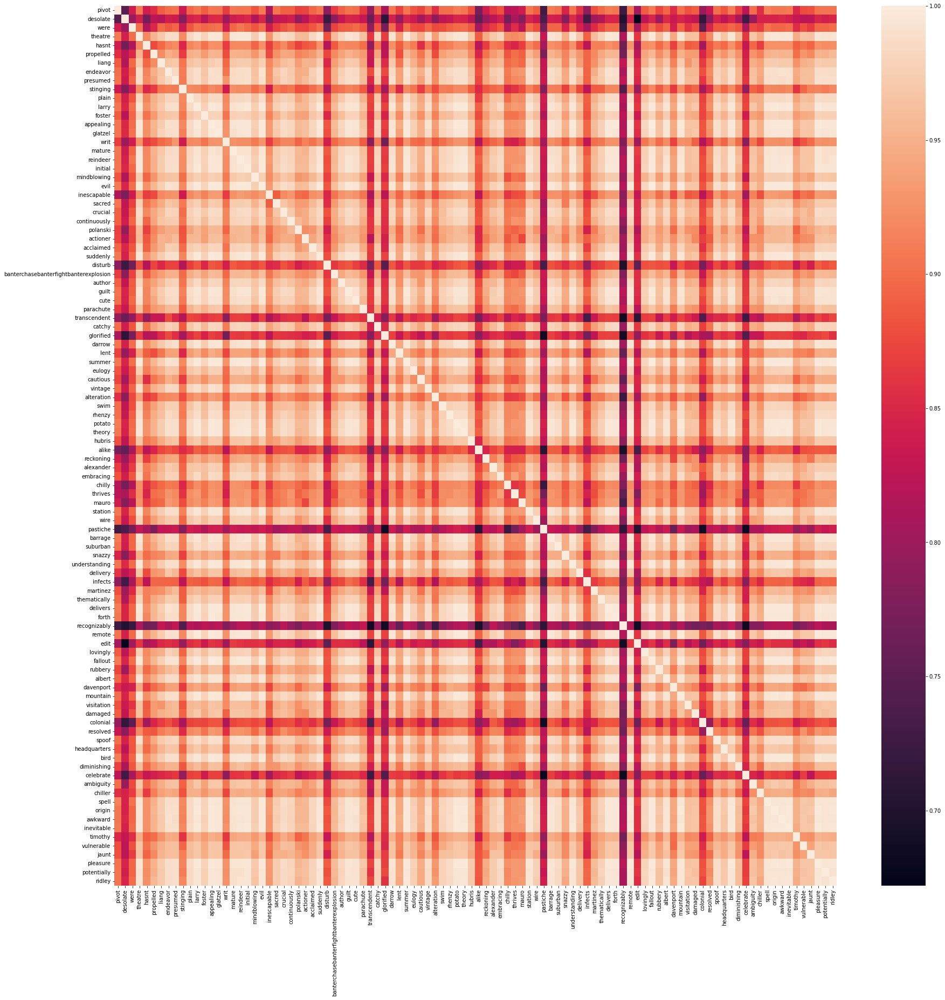

In [82]:
similarity  = cosine_similarity(df, df)
a4_dims = (30, 30)
fig, ax = pyplot.subplots(figsize=a4_dims)
sns.heatmap(ax=ax, data=similarity, xticklabels=random_labels, yticklabels=random_labels);

### 200 Embedding Dimensions

In [83]:
titles, final_processed_text, processed_text = process_corpus(data)
labels, tokens, word2vec_model = run_word2vec(processed_text, 200)

#### Plot word2vec TSNE

In [84]:
#create random subset of 100 tokens
weights = []

random_labels = random.sample(labels, 100)

for i in random_labels:
  weights.append(word2vec_model[i])

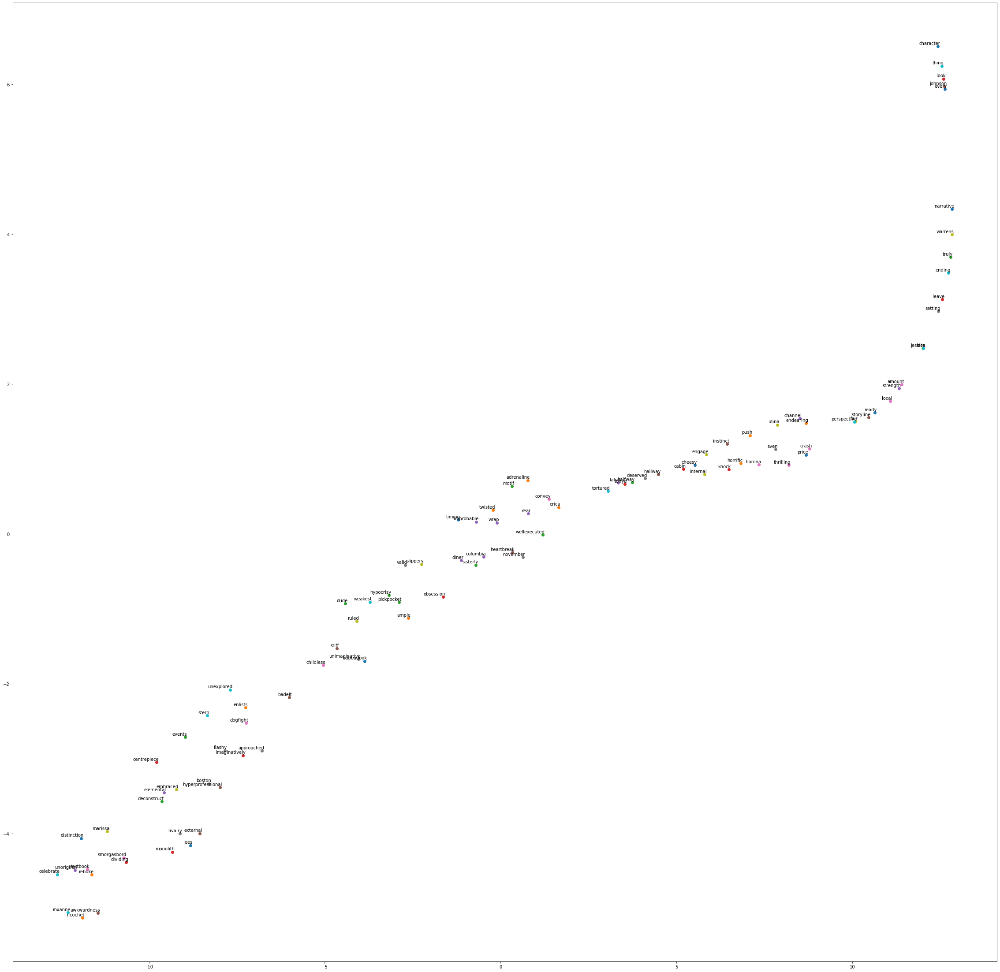

CPU times: user 2.5 s, sys: 143 ms, total: 2.65 s
Wall time: 2.13 s


In [85]:
%%time
plot_word2vec(word2vec_model, random_labels, weights, 20)

#### Plot word2vec heatmap for cosine similarity

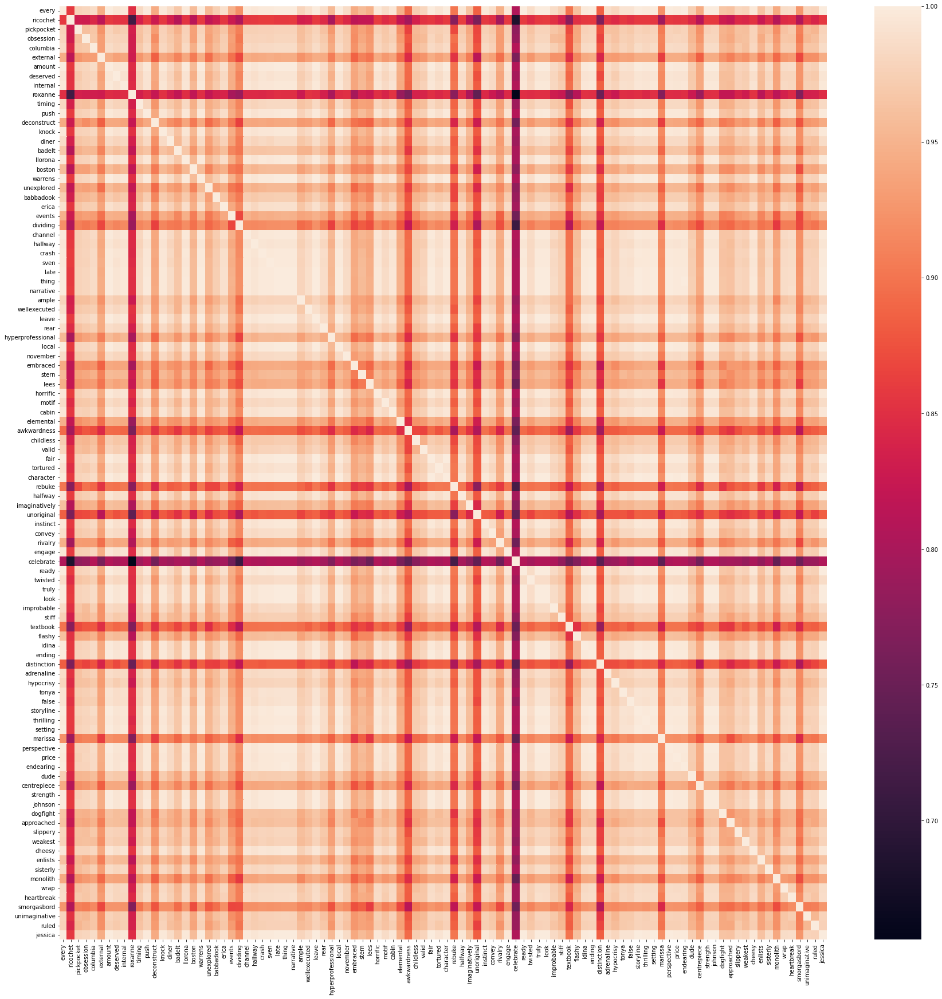

In [86]:
df = pd.DataFrame(weights, index=random_labels)

similarity  = cosine_similarity(df, df)
a4_dims = (30, 30)
fig, ax = pyplot.subplots(figsize=a4_dims)
sns.heatmap(ax=ax, data=similarity, xticklabels=random_labels, yticklabels=random_labels);

### 300 Embedding Dimensions

In [87]:
titles, final_processed_text, processed_text = process_corpus(data)
labels, tokens, word2vec_model = run_word2vec(processed_text, 300)

#### Plot word2vec TSNE

In [88]:
#create random subset of 100 tokens
weights = []

random_labels = random.sample(labels, 100)

for i in random_labels:
  weights.append(word2vec_model[i])

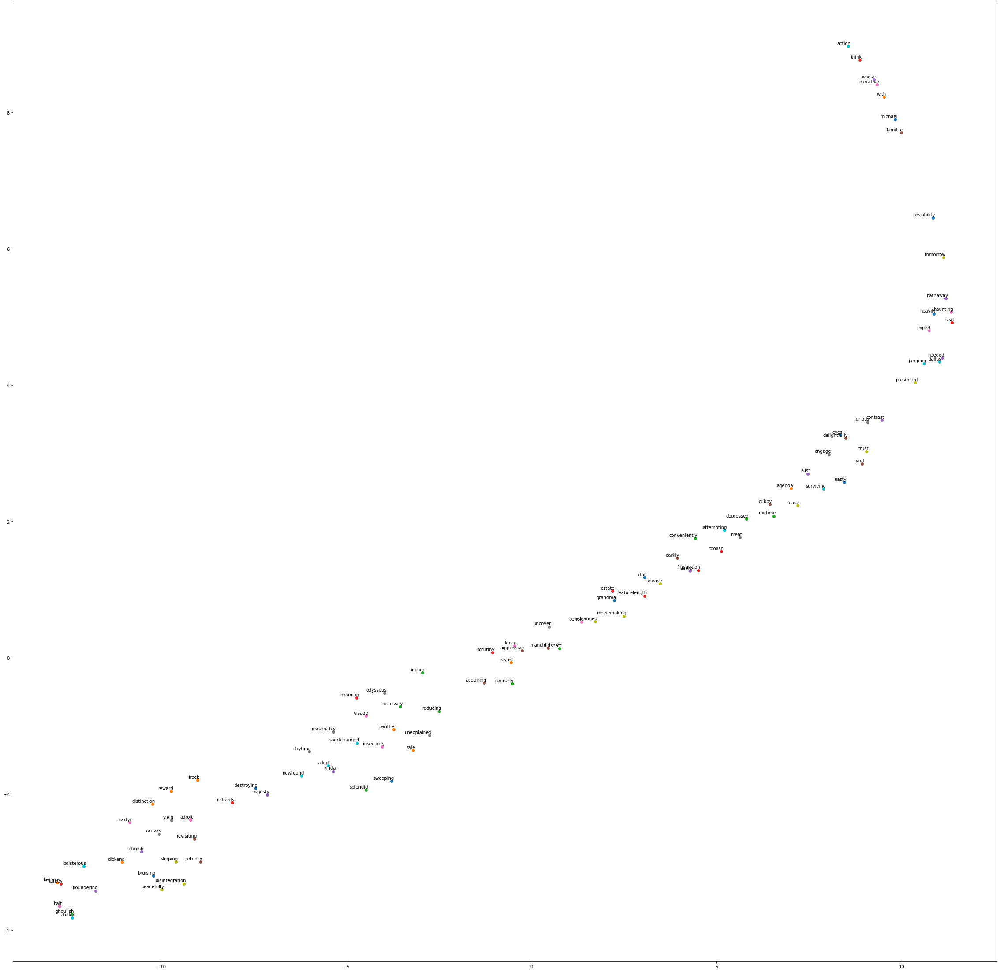

CPU times: user 2.42 s, sys: 127 ms, total: 2.54 s
Wall time: 2.09 s


In [89]:
%%time
plot_word2vec(word2vec_model, random_labels, weights, 20)

#### Plot word2vec heatmap for cosine similarity

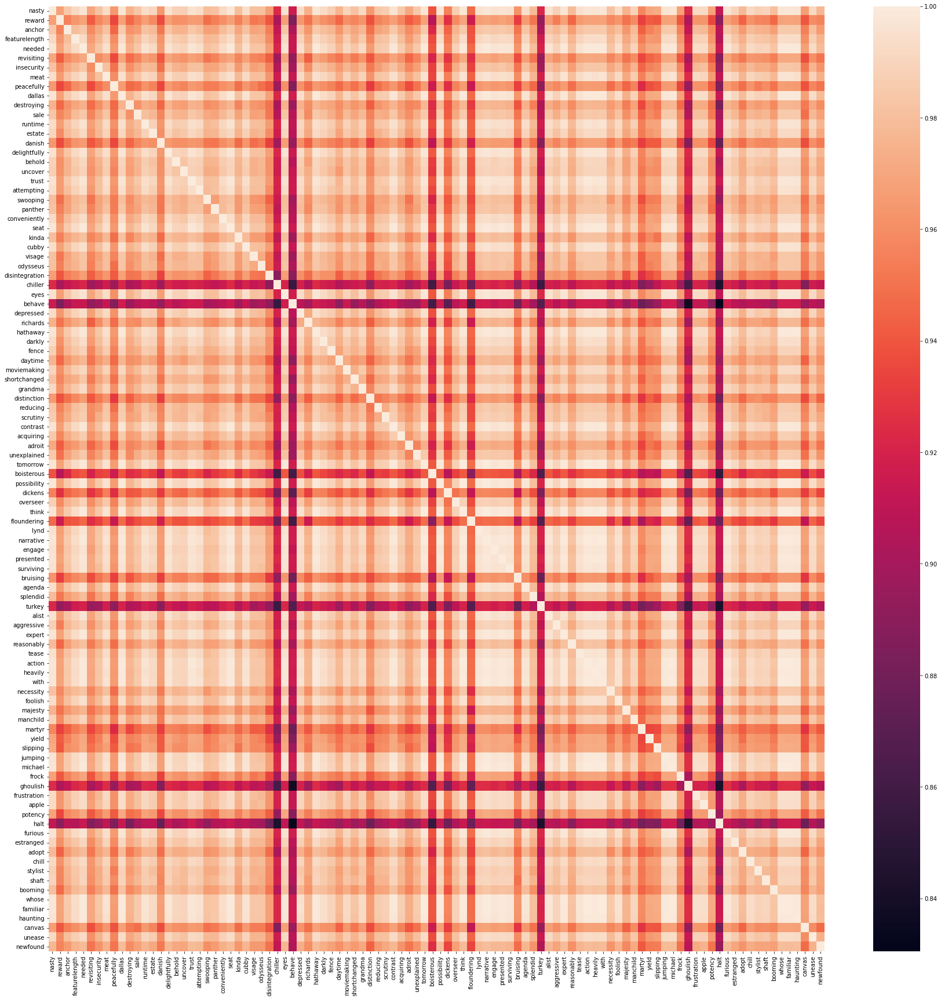

In [90]:
df = pd.DataFrame(weights, index=random_labels)

similarity  = cosine_similarity(df, df)
a4_dims = (30, 30)
fig, ax = pyplot.subplots(figsize=a4_dims)
sns.heatmap(ax=ax, data=similarity, xticklabels=random_labels, yticklabels=random_labels);

## Documents by Embedding Matrix

### 100 Embedding Dimensions

In [91]:
doc2vec_df = run_doc2vec(final_processed_text, processed_text, 100)

#### Plot doc2vec TSNE 

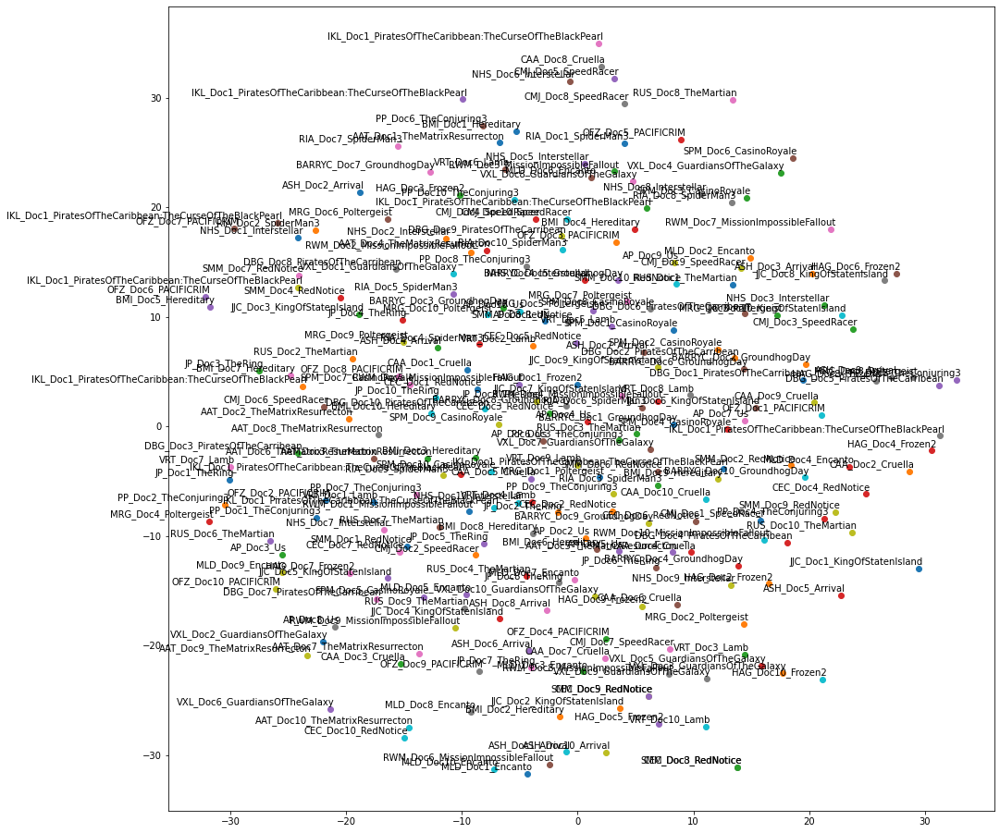

In [92]:
plot_doc2vec(doc2vec_df, titles,15)

#### Plot Heatmap of Cosine Similarity of Documents using TFIDF matrix

In [93]:
doc_term_matrix = transformed_documents.todense()
df = pd.DataFrame(doc_term_matrix, 
                      columns=vectorizer.get_feature_names(), 
                      index=docids)

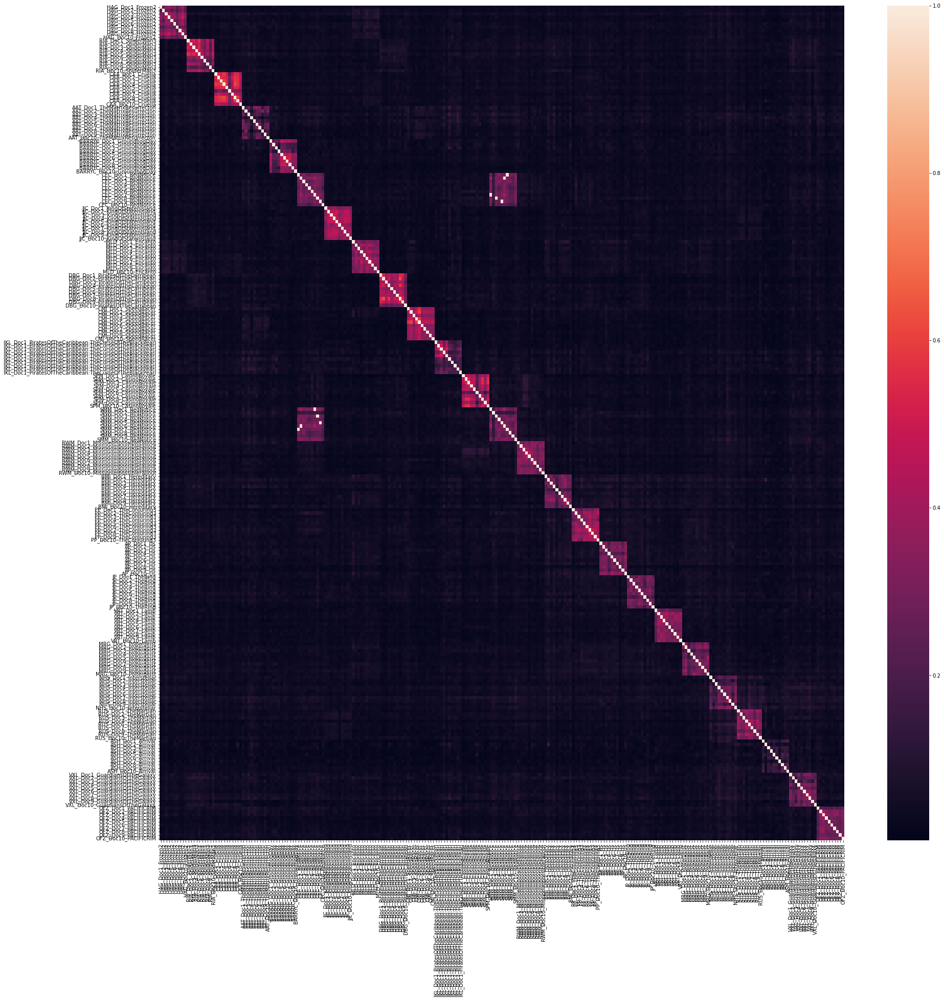

In [94]:
similarity  = cosine_similarity(df, df)
a4_dims = (30, 30)
fig, ax = pyplot.subplots(figsize=a4_dims)
sns.heatmap(ax=ax, data=similarity, xticklabels= titles, yticklabels=titles);

### 200 Embedding Dimensions

In [95]:
doc2vec_df = run_doc2vec(final_processed_text, processed_text, 200)

#### Plot doc2vec TSNE 

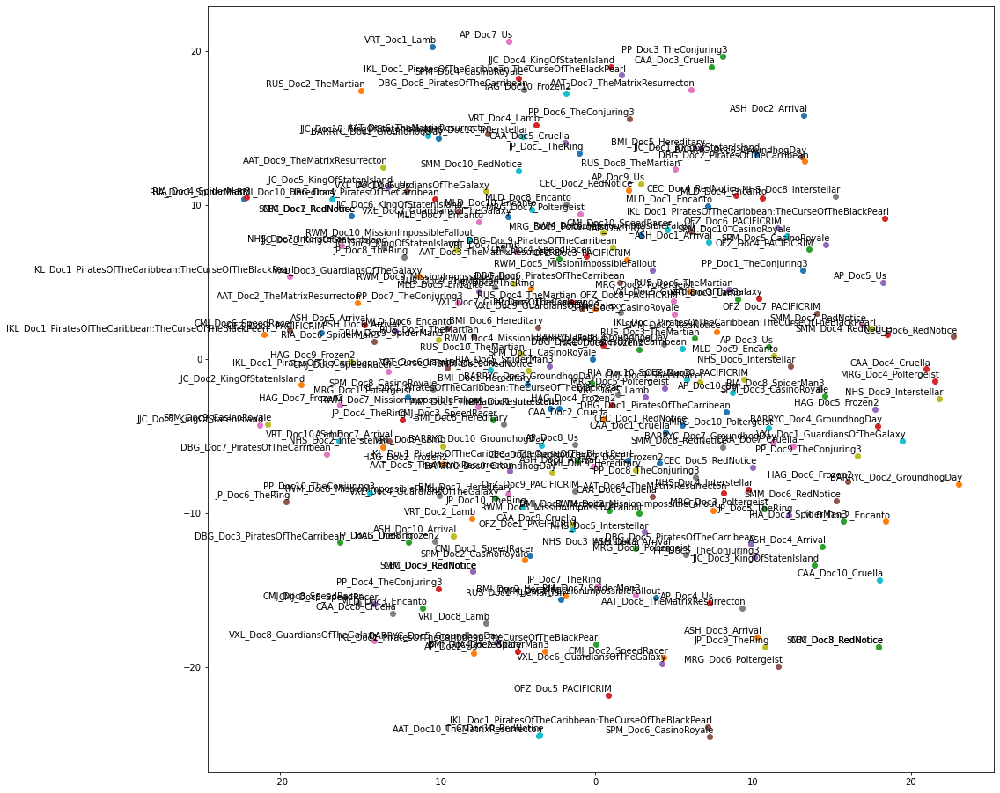

In [96]:
plot_doc2vec(doc2vec_df, titles,15)

#### Plot Heatmap of Cosine Similarity of Documents using TFIDF matrix

In [97]:
doc_term_matrix = transformed_documents.todense()
df = pd.DataFrame(doc_term_matrix, 
                      columns=vectorizer.get_feature_names(), 
                      index=docids)

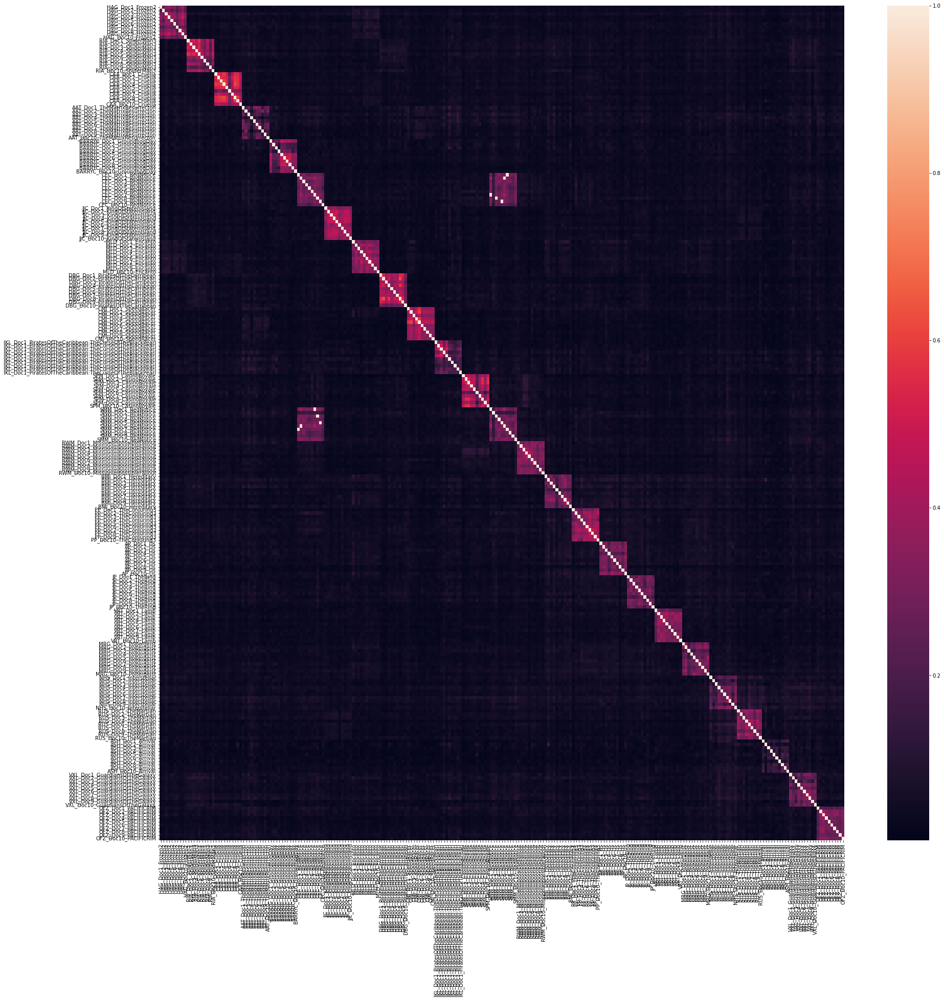

In [98]:
similarity  = cosine_similarity(df, df)
a4_dims = (30, 30)
fig, ax = pyplot.subplots(figsize=a4_dims)
sns.heatmap(ax=ax, data=similarity, xticklabels= titles, yticklabels=titles);

### 300 Embedding Dimensions

In [99]:
doc2vec_df = run_doc2vec(final_processed_text, processed_text, 300)

#### Plot doc2vec TSNE 

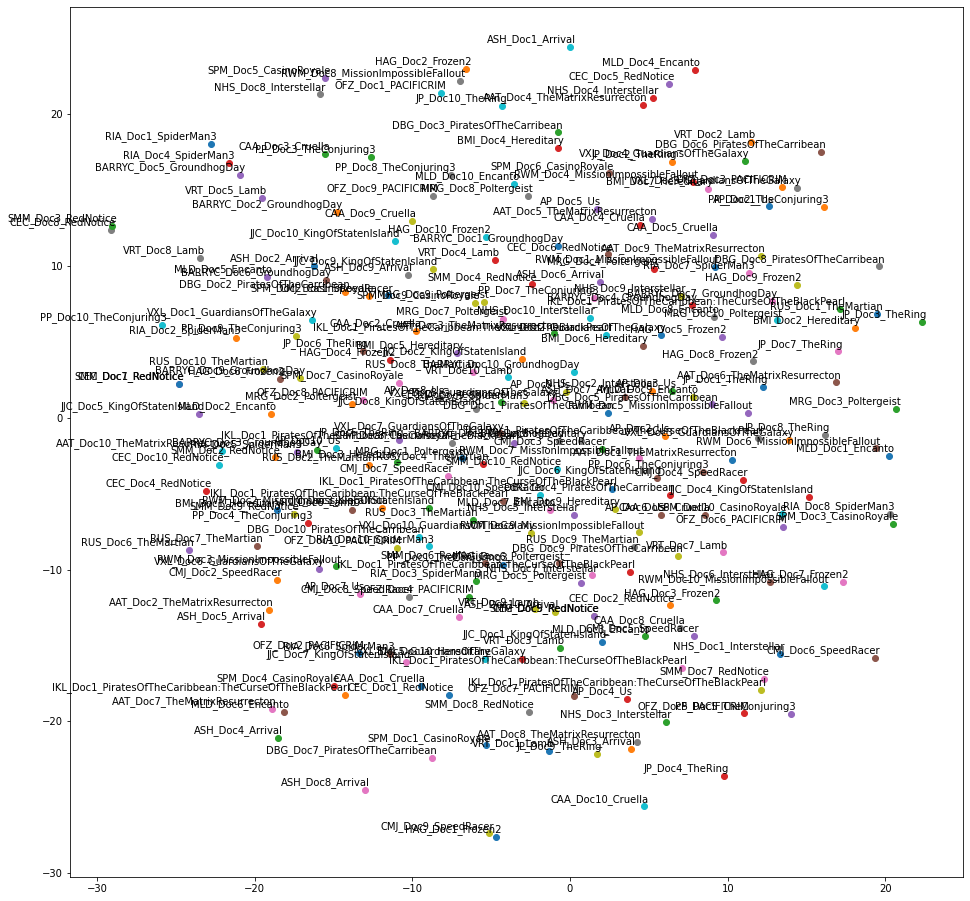

In [100]:
plot_doc2vec(doc2vec_df, titles,15)

#### Plot Heatmap of Cosine Similarity of Documents using TFIDF matrix

In [101]:
doc_term_matrix = transformed_documents.todense()
df = pd.DataFrame(doc_term_matrix, 
                      columns=vectorizer.get_feature_names(), 
                      index=docids)

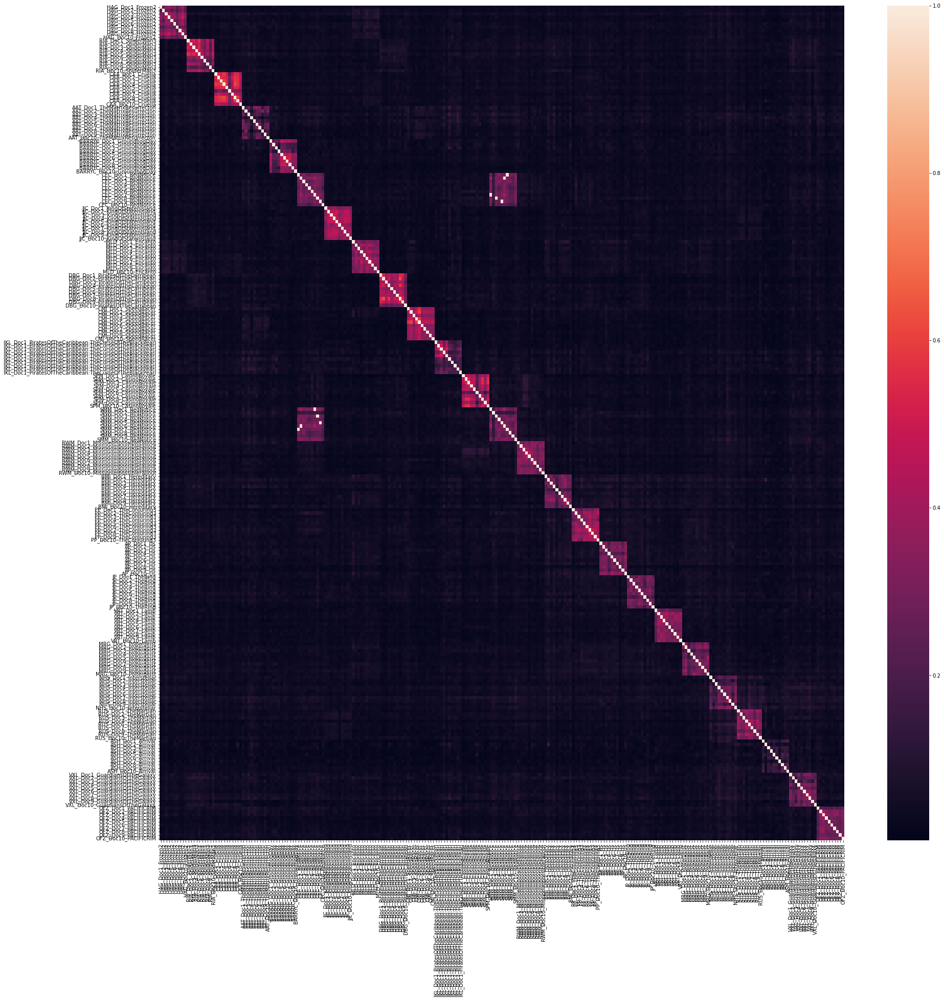

In [102]:
similarity  = cosine_similarity(df, df)
a4_dims = (30, 30)
fig, ax = pyplot.subplots(figsize=a4_dims)
sns.heatmap(ax=ax, data=similarity, xticklabels= titles, yticklabels=titles);